# Phase 1 — Environment and Reproducibility

##1.1 Import Cell

We started by gathering all general, image-processing, deep-learning, and evaluation dependencies in one place. Keeping imports together gives the notebook a clear dependency overview and avoids repeatedly importing libraries in later phases.

In [1]:
import os
import random
from pathlib import Path

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

from sklearn.metrics import (
    accuracy_score,
    confusion_matrix,
    classification_report,
    precision_recall_fscore_support,
    roc_auc_score,
    roc_curve,
)

## 1.2 Configuration Dictionary

The configuration dictionary centralises the main experimental settings, including image resolution, batch size, training duration, early stopping, regularisation, reproducibility seeds, output locations and hardware selection. It also defines AdamW as the optimiser and provides candidate learning rates for later validation-based comparison. During training, the scheduler will reduce the learning rate when improvement plateaus, while early stopping will limit unnecessary training and overfitting. These values form the initial experimental setup and can later be refined through hyperparameter tuning.

In [2]:
CFG = {
    "image_size": 224,
    "batch_size": 64,

    "backbone_epochs": 11,
    "expert_epochs": 15,
    "early_stopping_patience": 5,

    "optimizer": "AdamW",
    "initial_learning_rate": 1e-4,
    "learning_rate_candidates": [1e-4],

    "scheduler_factor": 0.5,
    "scheduler_patience": 2,
    "minimum_learning_rate": 1e-6,

    "weight_decay": 1e-4,

    "seeds": [0, 1],
    "fixed_backbone": "resnet18",
    "fixed_training_seed": 1,
    "fixed_best_epoch": 11,
    "num_workers": 2,

    "results_dir": "results_post_tuning",
    "checkpoint_dir": "checkpoints_post_tuning",

    "device": "cuda" if torch.cuda.is_available() else "cpu",
}

print("Selected device:", CFG["device"])
print(
    "Fixed model-selection settings:",
    CFG["fixed_backbone"],
    "seed",
    CFG["fixed_training_seed"],
    "learning rate",
    f"{CFG['initial_learning_rate']:.0e}",
    "epochs",
    CFG["fixed_best_epoch"],
)


Selected device: cuda
Fixed model-selection settings: resnet18 seed 1 learning rate 1e-04 epochs 11


## 1.3 Reproducibility and experiment organisation

Reproducibility and experiment organisation ensure that random operations, DataLoader workers and dataset shuffling remain controlled across runs. The code also creates separate directories for results and model checkpoints, keeping post-tuning outputs organised and protecting the original baseline files. We will continue grouping closely related operations into complete, purposeful cells.

In [3]:
def set_seed(seed):
    os.environ["PYTHONHASHSEED"] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False


def seed_worker(worker_id):
    worker_seed = torch.initial_seed() % (2**32)
    np.random.seed(worker_seed)
    random.seed(worker_seed)


def create_generator(seed):
    generator = torch.Generator()
    generator.manual_seed(seed)
    return generator


results_dir = Path(CFG["results_dir"])
checkpoint_dir = Path(CFG["checkpoint_dir"])

results_dir.mkdir(parents=True, exist_ok=True)
checkpoint_dir.mkdir(parents=True, exist_ok=True)

set_seed(CFG["seeds"][0])

print("Results directory:", results_dir.resolve())
print("Checkpoint directory:", checkpoint_dir.resolve())

Results directory: /content/results_post_tuning
Checkpoint directory: /content/checkpoints_post_tuning


# Phase 2 - Dataset Indexing and 80:10:10 Split

## 2.1 Stratified dataset Splitting

Stratified dataset splitting combines the available images and redistributes them into 80% training, 10% validation and 10% testing subsets. Stratification preserves the real/fake class balance in every subset, while the fixed random seed makes the split reproducible. Duplicate file paths are removed before splitting to reduce the risk of direct data leakage.

In [4]:
import kagglehub
from sklearn.model_selection import train_test_split

dataset_path = kagglehub.dataset_download(
    "xhlulu/140k-real-and-fake-faces"
)
dataset_root = next(Path(dataset_path).rglob("real-vs-fake"))

records = []

for source_split in ["train", "valid", "test"]:
    for label_name, label in [("real", 0), ("fake", 1)]:
        image_directory = dataset_root / source_split / label_name

        for image_path in image_directory.glob("*.jpg"):
            records.append({
                "path": str(image_path),
                "label": label,
                "label_name": label_name,
            })

dataset_df = pd.DataFrame(records).drop_duplicates("path")

train_df, temporary_df = train_test_split(
    dataset_df,
    test_size=0.20,
    stratify=dataset_df["label"],
    random_state=CFG["seeds"][0],
)

validation_df, test_df = train_test_split(
    temporary_df,
    test_size=0.50,
    stratify=temporary_df["label"],
    random_state=CFG["seeds"][0],
)

train_df = train_df.reset_index(drop=True)
validation_df = validation_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

print(f"Training:   {len(train_df):,} ({len(train_df) / len(dataset_df):.0%})")
print(f"Validation: {len(validation_df):,} ({len(validation_df) / len(dataset_df):.0%})")
print(f"Testing:    {len(test_df):,} ({len(test_df) / len(dataset_df):.0%})")

Using Colab cache for faster access to the '140k-real-and-fake-faces' dataset.
Training:   112,000 (80%)
Validation: 14,000 (10%)
Testing:    14,000 (10%)


## 2.2 Data-leakage prevention and class-balance verification

Data-leakage prevention and class-balance verification confirm that no image path appears in more than one subset. The summary table also shows the number of real and fake images assigned to training, validation and testing, allowing the stratified 80:10:10 split to be verified before any preprocessing or model training begins.

In [5]:
train_paths = set(train_df["path"])
validation_paths = set(validation_df["path"])
test_paths = set(test_df["path"])

assert train_paths.isdisjoint(validation_paths)
assert train_paths.isdisjoint(test_paths)
assert validation_paths.isdisjoint(test_paths)

split_summary = pd.DataFrame({
    "Training": train_df["label_name"].value_counts(),
    "Validation": validation_df["label_name"].value_counts(),
    "Testing": test_df["label_name"].value_counts(),
}).fillna(0).astype(int)

split_summary.loc["Total"] = split_summary.sum()

display(split_summary)
print("No duplicate file paths were found across the three subsets.")

,Training,Validation,Testing
label_name,,,
fake,56000,7000,7000
real,56000,7000,7000
Total,112000,14000,14000


No duplicate file paths were found across the three subsets.


# Phase 3 — Image Preprocessing and Augmentation

## 3.1 Controlled image degradation

Controlled image degradation defines the seven routing categories and three severity levels for every non-clean category. The function applies the selected degradation while keeping the original binary real/fake label unchanged. A supplied random-number generator controls stochastic noise, supporting reproducible experiments. The clean category returns the image without artificial degradation and serves as the clean expert’s training data.

**Each image receives one degradation type and one severity level rather than every possible combination. This keeps the dataset balanced and computationally manageable while reducing the number of highly correlated copies that could encourage memorisation. All degradation and severity combinations are still represented across the full dataset, and comprehensive robustness is measured later by applying every combination to a controlled test subset.**

In [6]:
DEGRADATION_NAMES = [
    "clean",
    "salt_pepper",
    "gaussian_noise",
    "gaussian_blur",
    "motion_blur",
    "low_resolution",
    "jpeg_compression",
]

DEGRADATION_LEVELS = {
    0: [0],
    1: [0.02, 0.05, 0.10],
    2: [10, 20, 35],
    3: [1, 2, 3],
    4: [7, 11, 15],
    5: [112, 56, 28],
    6: [70, 40, 15],
}


def apply_degradation(image, degradation_class, severity, rng):
    image = np.asarray(image, dtype=np.uint8)
    degradation_class = int(degradation_class)
    severity = float(severity)

    if degradation_class == 0:
        return image.copy()

    if degradation_class == 1:
        output = image.copy()
        mask = rng.random(image.shape[:2])

        output[mask < severity / 2] = 0
        output[mask > 1 - severity / 2] = 255

        return output

    if degradation_class == 2:
        noise = rng.normal(
            loc=0,
            scale=severity,
            size=image.shape,
        )

        return np.clip(
            image.astype(np.float32) + noise,
            0,
            255,
        ).astype(np.uint8)

    if degradation_class == 3:
        return cv2.GaussianBlur(
            image,
            ksize=(0, 0),
            sigmaX=severity,
        )

    if degradation_class == 4:
        kernel_size = int(round(severity))

        if kernel_size % 2 == 0:
            kernel_size += 1

        kernel = np.zeros(
            (kernel_size, kernel_size),
            dtype=np.float32,
        )
        kernel[kernel_size // 2, :] = 1.0 / kernel_size

        return cv2.filter2D(image, -1, kernel)

    if degradation_class == 5:
        target_size = max(1, int(round(severity)))
        height, width = image.shape[:2]

        reduced = cv2.resize(
            image,
            (target_size, target_size),
            interpolation=cv2.INTER_AREA,
        )

        return cv2.resize(
            reduced,
            (width, height),
            interpolation=cv2.INTER_LINEAR,
        )

    if degradation_class == 6:
        jpeg_quality = int(
            np.clip(round(severity), 1, 100)
        )

        settings = [
            cv2.IMWRITE_JPEG_QUALITY,
            jpeg_quality,
        ]

        success, encoded_image = cv2.imencode(
            ".jpg",
            cv2.cvtColor(image, cv2.COLOR_RGB2BGR),
            settings,
        )

        if not success:
            raise RuntimeError("JPEG compression failed.")

        decoded_image = cv2.imdecode(
            encoded_image,
            cv2.IMREAD_COLOR,
        )

        return cv2.cvtColor(
            decoded_image,
            cv2.COLOR_BGR2RGB,
        )

    raise ValueError(
        f"Unknown degradation class: {degradation_class}"
    )

## 3.2 Balanced Degradation and Severity Assignment

Balanced and reproducible degradation assignment gives every image one degradation category, one severity level and one unique random seed. The seven degradation categories are distributed approximately equally and shuffled to prevent ordering bias. Severity levels are balanced within each non-clean category, while clean images retain a severity of zero. The stored degradation seed ensures that stochastic effects such as noise can be recreated consistently. Separate seeds for training, validation and testing create independent but reproducible assignments across the three subsets.

In [7]:
def assign_degradations(dataframe, seed):
    assigned_df = dataframe.copy().reset_index(drop=True)
    rng = np.random.default_rng(seed)
    sample_count = len(assigned_df)

    degradation_classes = np.resize(
        np.arange(len(DEGRADATION_NAMES)),
        sample_count,
    )
    rng.shuffle(degradation_classes)

    assigned_df["degradation_class"] = degradation_classes
    assigned_df["degradation_name"] = assigned_df[
        "degradation_class"
    ].map(dict(enumerate(DEGRADATION_NAMES)))

    assigned_df["severity"] = 0.0

    for degradation_class in range(1, len(DEGRADATION_NAMES)):
        indices = assigned_df.index[
            assigned_df["degradation_class"] == degradation_class
        ]

        levels = np.resize(
            DEGRADATION_LEVELS[degradation_class],
            len(indices),
        ).astype(float)

        rng.shuffle(levels)
        assigned_df.loc[indices, "severity"] = levels

    assigned_df["degradation_seed"] = rng.integers(
        0,
        2**32 - 1,
        size=sample_count,
    )

    return assigned_df


train_df = assign_degradations(train_df, CFG["seeds"][0])
validation_df = assign_degradations(validation_df, CFG["seeds"][0] + 1)
test_df = assign_degradations(test_df, CFG["seeds"][0] + 2)

display(train_df.head())

,path,label,label_name,degradation_class,degradation_name,severity,degradation_seed
0,/kaggle/input/140k-real-and-fake-faces/real_vs...,0,real,3,gaussian_blur,3.00,1630817287
1,/kaggle/input/140k-real-and-fake-faces/real_vs...,1,fake,5,low_resolution,56.00,2485702222
2,/kaggle/input/140k-real-and-fake-faces/real_vs...,0,real,3,gaussian_blur,1.00,3449376055
3,/kaggle/input/140k-real-and-fake-faces/real_vs...,1,fake,3,gaussian_blur,1.00,3924563763
4,/kaggle/input/140k-real-and-fake-faces/real_vs...,1,fake,1,salt_pepper,0.02,1326966673


## 3.3 Degradation Statistics

Degradation and severity analysis summarises how images are distributed across dataset splits, degradation categories, severity levels and real/fake classes. The tables provide exact counts, while the charts make imbalances or assignment errors easier to identify before training begins. These statistics describe the recorded degradation assignments; the transformations themselves are generated when images are loaded rather than saved as duplicate image files.

DATASET AND CLASS SUMMARY


,total_images,unique_images,real_images,fake_images,dataset_percentage,real_percentage,fake_percentage
split,,,,,,,
Training,112000,112000,56000,56000,80.0,50.0,50.0
Validation,14000,14000,7000,7000,10.0,50.0,50.0
Testing,14000,14000,7000,7000,10.0,50.0,50.0


DEGRADATION COUNTS BY SPLIT


split,Training,Validation,Testing
degradation_name,,,
clean,16000,2000,2000
salt_pepper,16000,2000,2000
gaussian_noise,16000,2000,2000
gaussian_blur,16000,2000,2000
motion_blur,16000,2000,2000
low_resolution,16000,2000,2000
jpeg_compression,16000,2000,2000


DEGRADATION PERCENTAGES BY SPLIT


split,Training,Validation,Testing
degradation_name,,,
clean,14.29,14.29,14.29
salt_pepper,14.29,14.29,14.29
gaussian_noise,14.29,14.29,14.29
gaussian_blur,14.29,14.29,14.29
motion_blur,14.29,14.29,14.29
low_resolution,14.29,14.29,14.29
jpeg_compression,14.29,14.29,14.29


SEVERITY DISTRIBUTION


,split,degradation_name,severity,image_count,percentage_within_degradation
0,Training,clean,0.00,16000,100.00
1,Training,salt_pepper,0.02,5334,33.34
2,Training,salt_pepper,0.05,5333,33.33
3,Training,salt_pepper,0.10,5333,33.33
4,Training,gaussian_noise,10.00,5334,33.34
5,Training,gaussian_noise,20.00,5333,33.33
6,Training,gaussian_noise,35.00,5333,33.33
7,Training,gaussian_blur,1.00,5334,33.34
8,Training,gaussian_blur,2.00,5333,33.33
9,Training,gaussian_blur,3.00,5333,33.33


REAL/FAKE BALANCE BY DEGRADATION


label_name,fake,real,total,real_percentage,fake_percentage
degradation_name,,,,,
clean,10009,9991,20000,49.96,50.04
salt_pepper,10054,9946,20000,49.73,50.27
gaussian_noise,9972,10028,20000,50.14,49.86
gaussian_blur,10096,9904,20000,49.52,50.48
motion_blur,9905,10095,20000,50.48,49.53
low_resolution,9929,10071,20000,50.36,49.64
jpeg_compression,10035,9965,20000,49.82,50.18


DEGRADATION BALANCE DIAGNOSTICS


,minimum_category_size,maximum_category_size,maximum_difference,imbalance_percentage
split,,,,
Training,16000,16000,0,0.0
Validation,2000,2000,0,0.0
Testing,2000,2000,0,0.0


DATA-LEAKAGE CHECK


,check,count,status
0,Duplicate image rows,0,PASS
1,Images appearing across multiple splits,0,PASS


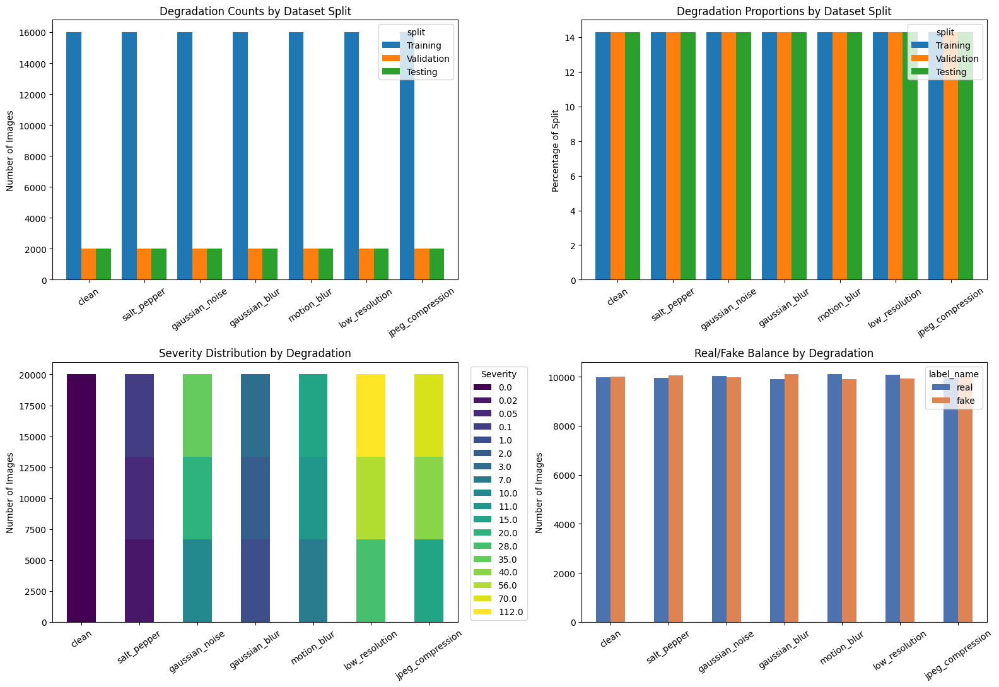

In [8]:
split_order = ["Training", "Validation", "Testing"]

statistics_df = pd.concat(
    [
        train_df.assign(split="Training"),
        validation_df.assign(split="Validation"),
        test_df.assign(split="Testing"),
    ],
    ignore_index=True,
)

statistics_df["split"] = pd.Categorical(
    statistics_df["split"],
    categories=split_order,
    ordered=True,
)

statistics_df["degradation_name"] = pd.Categorical(
    statistics_df["degradation_name"],
    categories=DEGRADATION_NAMES,
    ordered=True,
)

# Overall split and class summary
split_summary = (
    statistics_df
    .groupby("split", observed=False)
    .agg(
        total_images=("path", "size"),
        unique_images=("path", "nunique"),
        real_images=("label", lambda values: (values == 0).sum()),
        fake_images=("label", lambda values: (values == 1).sum()),
    )
)

split_summary["dataset_percentage"] = (
    split_summary["total_images"]
    / split_summary["total_images"].sum()
    * 100
).round(2)

split_summary["real_percentage"] = (
    split_summary["real_images"]
    / split_summary["total_images"]
    * 100
).round(2)

split_summary["fake_percentage"] = (
    split_summary["fake_images"]
    / split_summary["total_images"]
    * 100
).round(2)

# Degradation counts and percentages by split
degradation_counts = pd.crosstab(
    statistics_df["degradation_name"],
    statistics_df["split"],
).reindex(
    index=DEGRADATION_NAMES,
    columns=split_order,
    fill_value=0,
)

degradation_percentages = (
    degradation_counts
    .div(degradation_counts.sum(axis=0), axis=1)
    .mul(100)
    .round(2)
)

# Severity counts and within-degradation percentages
severity_counts = (
    statistics_df
    .groupby(
        ["split", "degradation_name", "severity"],
        observed=True,
    )
    .size()
    .rename("image_count")
    .reset_index()
)

severity_counts["percentage_within_degradation"] = (
    severity_counts["image_count"]
    / severity_counts.groupby(
        ["split", "degradation_name"],
        observed=True,
    )["image_count"].transform("sum")
    * 100
).round(2)

# Real/fake balance within each degradation
class_by_degradation = pd.crosstab(
    statistics_df["degradation_name"],
    statistics_df["label_name"],
).reindex(DEGRADATION_NAMES, fill_value=0)

class_by_degradation["total"] = class_by_degradation.sum(axis=1)

for class_name in ["real", "fake"]:
    if class_name in class_by_degradation.columns:
        class_by_degradation[f"{class_name}_percentage"] = (
            class_by_degradation[class_name]
            / class_by_degradation["total"]
            * 100
        ).round(2)

# Balance diagnostics
degradation_balance = pd.DataFrame({
    "minimum_category_size": degradation_counts.min(axis=0),
    "maximum_category_size": degradation_counts.max(axis=0),
})

degradation_balance["maximum_difference"] = (
    degradation_balance["maximum_category_size"]
    - degradation_balance["minimum_category_size"]
)

degradation_balance["imbalance_percentage"] = (
    degradation_balance["maximum_difference"]
    / degradation_balance["maximum_category_size"]
    * 100
).round(2)

# Leakage checks
path_split_counts = statistics_df.groupby("path")["split"].nunique()
cross_split_duplicates = int((path_split_counts > 1).sum())
duplicate_rows = int(statistics_df.duplicated("path").sum())

print("DATASET AND CLASS SUMMARY")
display(split_summary)

print("DEGRADATION COUNTS BY SPLIT")
display(degradation_counts)

print("DEGRADATION PERCENTAGES BY SPLIT")
display(degradation_percentages)

print("SEVERITY DISTRIBUTION")
display(severity_counts)

print("REAL/FAKE BALANCE BY DEGRADATION")
display(class_by_degradation)

print("DEGRADATION BALANCE DIAGNOSTICS")
display(degradation_balance)

print("DATA-LEAKAGE CHECK")
display(
    pd.DataFrame({
        "check": [
            "Duplicate image rows",
            "Images appearing across multiple splits",
        ],
        "count": [
            duplicate_rows,
            cross_split_duplicates,
        ],
        "status": [
            "PASS" if duplicate_rows == 0 else "REVIEW",
            "PASS" if cross_split_duplicates == 0 else "FAIL",
        ],
    })
)

figure, axes = plt.subplots(2, 2, figsize=(16, 11))

degradation_counts.plot(
    kind="bar",
    ax=axes[0, 0],
    width=0.8,
)
axes[0, 0].set_title("Degradation Counts by Dataset Split")
axes[0, 0].set_xlabel("")
axes[0, 0].set_ylabel("Number of Images")
axes[0, 0].tick_params(axis="x", rotation=35)

degradation_percentages.plot(
    kind="bar",
    ax=axes[0, 1],
    width=0.8,
)
axes[0, 1].set_title("Degradation Proportions by Dataset Split")
axes[0, 1].set_xlabel("")
axes[0, 1].set_ylabel("Percentage of Split")
axes[0, 1].tick_params(axis="x", rotation=35)

severity_overall = (
    severity_counts
    .groupby(["degradation_name", "severity"], observed=True)["image_count"]
    .sum()
    .unstack(fill_value=0)
    .reindex(DEGRADATION_NAMES)
)

severity_overall.plot(
    kind="bar",
    stacked=True,
    ax=axes[1, 0],
    colormap="viridis",
)
axes[1, 0].set_title("Severity Distribution by Degradation")
axes[1, 0].set_xlabel("")
axes[1, 0].set_ylabel("Number of Images")
axes[1, 0].tick_params(axis="x", rotation=35)
axes[1, 0].legend(title="Severity", bbox_to_anchor=(1.02, 1))

class_plot = class_by_degradation[
    [
        column
        for column in ["real", "fake"]
        if column in class_by_degradation.columns
    ]
]

class_plot.plot(
    kind="bar",
    ax=axes[1, 1],
    color=["#4C72B0", "#DD8452"][:len(class_plot.columns)],
)
axes[1, 1].set_title("Real/Fake Balance by Degradation")
axes[1, 1].set_xlabel("")
axes[1, 1].set_ylabel("Number of Images")
axes[1, 1].tick_params(axis="x", rotation=35)

plt.tight_layout()
plt.show()

## 3.4 Visual Degradation Examples

Assigned degradation visualisation selects one real dataset record from each degradation category and compares its original image with the single degraded version used by the pipeline. Every example uses its recorded degradation type, severity and random seed, accurately representing the one-degradation-per-image design. Different severity levels remain represented across the full dataset and are quantified in the preceding statistics.

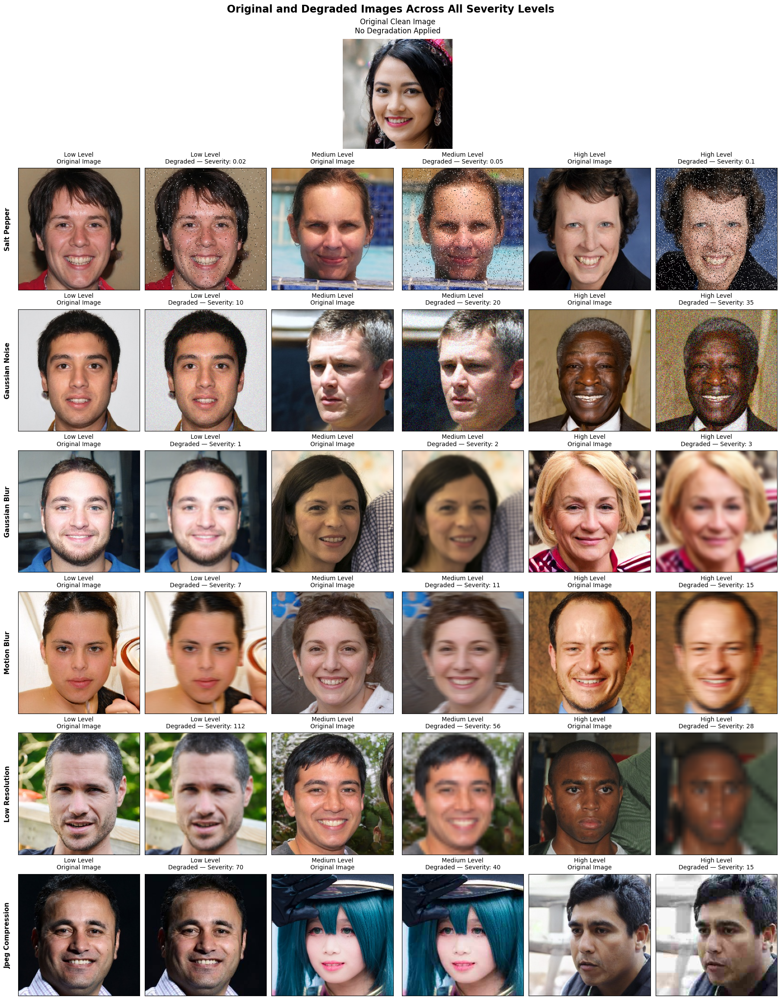

In [9]:
severity_names = ["Low", "Medium", "High"]

figure = plt.figure(
    figsize=(18, 23),
    constrained_layout=True,
)

grid = figure.add_gridspec(
    nrows=len(DEGRADATION_NAMES),
    ncols=6,
    height_ratios=[0.9, 1, 1, 1, 1, 1, 1],
)

# Clean image: displayed once because no degradation is applied
clean_record = test_df[
    test_df["degradation_class"] == 0
].sample(
    n=1,
    random_state=CFG["seeds"][0],
).iloc[0]

clean_image = Image.open(clean_record["path"]).convert("RGB")

clean_axis = figure.add_subplot(grid[0, 2:4])
clean_axis.imshow(clean_image)
clean_axis.set_title(
    "Original Clean Image\nNo Degradation Applied",
    fontsize=12,
    pad=10,
)
clean_axis.axis("off")

# Original/degraded pairs for all non-clean categories and severities
for degradation_class in range(1, len(DEGRADATION_NAMES)):
    degradation_name = DEGRADATION_NAMES[degradation_class]
    row = degradation_class

    for severity_index, severity in enumerate(
        DEGRADATION_LEVELS[degradation_class]
    ):
        matching_records = test_df[
            (test_df["degradation_class"] == degradation_class)
            & np.isclose(test_df["severity"], severity)
        ]

        if matching_records.empty:
            raise ValueError(
                f"No test image found for {degradation_name} "
                f"at severity {severity}."
            )

        record = matching_records.sample(
            n=1,
            random_state=(
                CFG["seeds"][0]
                + degradation_class * 10
                + severity_index
            ),
        ).iloc[0]

        original_image = Image.open(record["path"]).convert("RGB")
        rng = np.random.default_rng(int(record["degradation_seed"]))

        degraded_image = apply_degradation(
            original_image,
            degradation_class,
            severity,
            rng,
        )

        original_column = severity_index * 2
        degraded_column = original_column + 1

        original_axis = figure.add_subplot(
            grid[row, original_column]
        )
        degraded_axis = figure.add_subplot(
            grid[row, degraded_column]
        )

        original_axis.imshow(original_image)
        degraded_axis.imshow(degraded_image)

        original_axis.set_title(
            f"{severity_names[severity_index]} Level\nOriginal Image",
            fontsize=10,
            pad=8,
        )

        degraded_axis.set_title(
            f"{severity_names[severity_index]} Level\n"
            f"Degraded — Severity: {severity}",
            fontsize=10,
            pad=8,
        )

        if severity_index == 0:
            original_axis.set_ylabel(
                degradation_name.replace("_", " ").title(),
                fontsize=11,
                fontweight="bold",
                labelpad=12,
            )

        original_axis.set_xticks([])
        original_axis.set_yticks([])
        degraded_axis.set_xticks([])
        degraded_axis.set_yticks([])

figure.suptitle(
    "Original and Degraded Images Across All Severity Levels",
    fontsize=17,
    fontweight="bold",
)

plt.show()

## 3.2 Image resizing, augmentation and normalization

Image resizing, augmentation and normalization prepare all images at the configured 224×224 resolution. Training images receive moderate flipping, rotation, shifting, scaling, brightness and contrast changes to reduce overfitting without substantially altering facial features. Validation and test images are only resized and normalized to provide stable evaluation. ToTensor() scales pixel values from 0–255 to 0–1, after which ImageNet normalization matches the input distribution expected by pretrained backbones.

ImageNet normalization uses channel means `[0.485, 0.456, 0.406]` and standard deviations `[0.229, 0.224, 0.225]` because the proposed CNN backbones were pretrained on ImageNet using these values. `ToTensor()` first scales RGB pixels from `0–255` to `0–1`, after which normalization standardises each colour channel using `(pixel − mean) ÷ standard deviation`. Matching the original preprocessing helps the pretrained features transfer correctly to the face-classification task. html).

This applies horizontal flipping, rotation, shifting, zooming, shearing, perspective adjustment and controlled colour variation. Vertical flipping is excluded because upside-down faces are generally unrealistic. The visualisation should next show each augmentation separately and then the final combined image received by the model.

In [10]:
imagenet_mean = [0.485, 0.456, 0.406]
imagenet_std = [0.229, 0.224, 0.225]

training_augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),

    transforms.RandomApply([
        transforms.RandomRotation(degrees=12)
    ], p=0.5),

    transforms.RandomApply([
        transforms.RandomAffine(
            degrees=0,
            translate=(0.08, 0.08),
            scale=(0.90, 1.10),
            shear=(-3, 3),
        )
    ], p=0.5),

    transforms.RandomApply([
        transforms.ColorJitter(
            brightness=0.15,
            contrast=0.15,
            saturation=0.10,
            hue=0.02,
        )
    ], p=0.4),

    transforms.RandomPerspective(
        distortion_scale=0.08,
        p=0.2,
    ),
])

train_transform = transforms.Compose([
    transforms.Resize(
        (CFG["image_size"], CFG["image_size"])
    ),
    training_augmentation,
    transforms.ToTensor(),
    transforms.Normalize(
        imagenet_mean,
        imagenet_std,
    ),
])

evaluation_transform = transforms.Compose([
    transforms.Resize(
        (CFG["image_size"], CFG["image_size"])
    ),
    transforms.ToTensor(),
    transforms.Normalize(
        imagenet_mean,
        imagenet_std,
    ),
])

## 3.5 Visualising Preprocessing and Augmentation

Preprocessing and augmentation visualisation follows several training images from their original form through the assigned degradation, resizing, random augmentation and ImageNet normalization. The normalized tensors are clipped only for visual display because their true values can fall below zero or above one; the model receives the complete unclipped tensors. Channel means and standard deviations are included to show the numerical effect of normalization.

**Augmentation is applied dynamically when an image is loaded, so it does not increase the number of stored dataset records.**

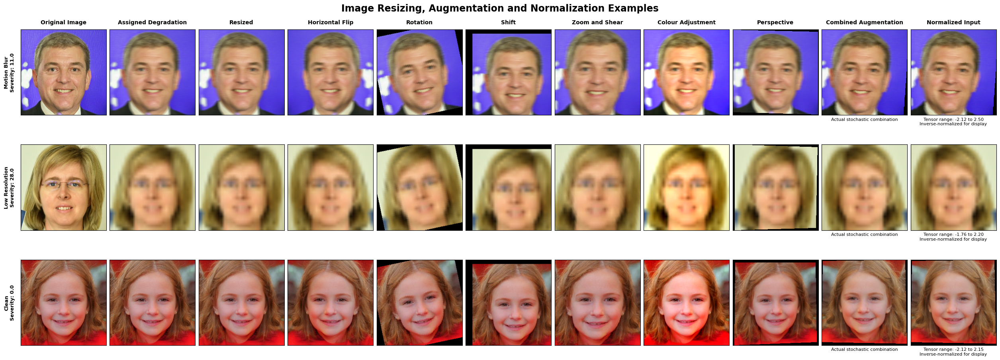

In [11]:
example_records = train_df.sample(
    n=3,
    random_state=CFG["seeds"][0],
).reset_index(drop=True)

column_titles = [
    "Original Image",
    "Assigned Degradation",
    "Resized",
    "Horizontal Flip",
    "Rotation",
    "Shift",
    "Zoom and Shear",
    "Colour Adjustment",
    "Perspective",
    "Combined Augmentation",
    "Normalized Input",
]

figure, axes = plt.subplots(
    len(example_records),
    len(column_titles),
    figsize=(25, 9),
    constrained_layout=True,
)

for column, title in enumerate(column_titles):
    axes[0, column].set_title(
        title,
        fontsize=10,
        fontweight="bold",
        pad=10,
    )

for row, record in example_records.iterrows():
    original_image = Image.open(record["path"]).convert("RGB")

    degradation_rng = np.random.default_rng(
        int(record["degradation_seed"])
    )

    degraded_array = apply_degradation(
        original_image,
        int(record["degradation_class"]),
        record["severity"],
        degradation_rng,
    )

    degraded_image = Image.fromarray(degraded_array)

    resized_image = transforms.functional.resize(
        degraded_image,
        [CFG["image_size"], CFG["image_size"]],
    )

    flipped_image = transforms.functional.hflip(
        resized_image
    )

    rotated_image = transforms.functional.rotate(
        resized_image,
        angle=12,
    )

    shifted_image = transforms.functional.affine(
        resized_image,
        angle=0,
        translate=[18, 12],
        scale=1.0,
        shear=[0.0, 0.0],
    )

    zoomed_sheared_image = transforms.functional.affine(
        resized_image,
        angle=0,
        translate=[0, 0],
        scale=1.10,
        shear=[3.0, 0.0],
    )

    colour_adjusted_image = transforms.functional.adjust_brightness(
        resized_image,
        brightness_factor=1.15,
    )
    colour_adjusted_image = transforms.functional.adjust_contrast(
        colour_adjusted_image,
        contrast_factor=1.15,
    )
    colour_adjusted_image = transforms.functional.adjust_saturation(
        colour_adjusted_image,
        saturation_factor=1.10,
    )

    with torch.random.fork_rng():
        torch.manual_seed(CFG["seeds"][0] + row)

        perspective_image = transforms.RandomPerspective(
            distortion_scale=0.08,
            p=1.0,
        )(resized_image)

        combined_image = training_augmentation(
            resized_image
        )

    combined_tensor = transforms.ToTensor()(
        combined_image
    )

    normalized_tensor = transforms.Normalize(
        mean=imagenet_mean,
        std=imagenet_std,
    )(combined_tensor)

    mean_tensor = torch.tensor(
        imagenet_mean
    ).view(3, 1, 1)

    std_tensor = torch.tensor(
        imagenet_std
    ).view(3, 1, 1)

    normalized_preview = (
        normalized_tensor * std_tensor + mean_tensor
    ).clamp(0, 1)

    normalized_preview = (
        normalized_preview
        .permute(1, 2, 0)
        .cpu()
        .numpy()
    )

    displayed_images = [
        original_image,
        degraded_image,
        resized_image,
        flipped_image,
        rotated_image,
        shifted_image,
        zoomed_sheared_image,
        colour_adjusted_image,
        perspective_image,
        combined_image,
        normalized_preview,
    ]

    for column, displayed_image in enumerate(displayed_images):
        axes[row, column].imshow(displayed_image)
        axes[row, column].set_xticks([])
        axes[row, column].set_yticks([])

    axes[row, 0].set_ylabel(
        f"{record['degradation_name'].replace('_', ' ').title()}\n"
        f"Severity: {record['severity']}",
        fontsize=9,
        fontweight="bold",
        labelpad=10,
    )

    axes[row, 9].set_xlabel(
        "Actual stochastic combination",
        fontsize=8,
    )

    axes[row, 10].set_xlabel(
        f"Tensor range: "
        f"{normalized_tensor.min():.2f} to "
        f"{normalized_tensor.max():.2f}\n"
        "Inverse-normalized for display",
        fontsize=8,
    )

figure.suptitle(
    "Image Resizing, Augmentation and Normalization Examples",
    fontsize=17,
    fontweight="bold",
)

plt.show()

## 3.6 Dataset construction and processing order

**Dataset construction and processing order** connect the indexed records to the model-training pipeline. Each image is loaded in RGB format, given its assigned reproducible degradation and then passed through the appropriate resizing, augmentation and normalization transformations. Alongside the processed image tensor, the dataset returns the real/fake label, degradation category and severity value required for training and evaluating both the expert router and binary classifiers.

In [12]:
class DegradedFaceDataset(Dataset):
    def __init__(self, dataframe, transform):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        record = self.dataframe.iloc[index]

        image = Image.open(record["path"]).convert("RGB")
        rng = np.random.default_rng(int(record["degradation_seed"]))

        degraded_image = apply_degradation(
            image=image,
            degradation_class=int(record["degradation_class"]),
            severity=record["severity"],
            rng=rng,
        )

        degraded_image = Image.fromarray(degraded_image)
        image_tensor = self.transform(degraded_image)

        binary_label = torch.tensor(record["label"], dtype=torch.long)
        degradation_label = torch.tensor(
            record["degradation_class"], dtype=torch.long
        )
        severity = torch.tensor(record["severity"], dtype=torch.float32)

        return image_tensor, binary_label, degradation_label, severity

## 3.7 Dataset and DataLoader Creation

Efficient and reproducible batch loading links each dataset subset to its appropriate transformation pipeline. Training data are shuffled and augmented, whereas validation and test data retain a fixed order and receive no random augmentation. Seeded workers and a seeded training generator improve reproducibility, while pinned memory can accelerate transfers to the GPU when CUDA is available.

In [13]:
train_dataset = DegradedFaceDataset(
    train_df,
    transform=train_transform,
)

validation_dataset = DegradedFaceDataset(
    validation_df,
    transform=evaluation_transform,
)

test_dataset = DegradedFaceDataset(
    test_df,
    transform=evaluation_transform,
)

loader_settings = {
    "batch_size": CFG["batch_size"],
    "num_workers": CFG["num_workers"],
    "pin_memory": CFG["device"] == "cuda",
    "worker_init_fn": seed_worker,
}

train_loader = DataLoader(
    train_dataset,
    shuffle=True,
    generator=create_generator(CFG["seeds"][0]),
    **loader_settings,
)

validation_loader = DataLoader(
    validation_dataset,
    shuffle=False,
    **loader_settings,
)

test_loader = DataLoader(
    test_dataset,
    shuffle=False,
    **loader_settings,
)

print("Training batches:", len(train_loader))
print("Validation batches:", len(validation_loader))
print("Testing batches:", len(test_loader))

Training batches: 1750
Validation batches: 219
Testing batches: 219


## 3.8 DataLoader Integrity Check

DataLoader integrity verification checks that a training batch has the expected four-dimensional image shape, three RGB channels, configured resolution and valid numerical values. It also confirms that the binary and degradation labels fall within their permitted ranges. Completing this check before model construction helps identify preprocessing or batching errors before expensive training begins.

In [14]:
images, binary_labels, degradation_labels, severities = next(
    iter(train_loader)
)

assert images.ndim == 4
assert images.shape[1:] == (
    3,
    CFG["image_size"],
    CFG["image_size"],
)
assert torch.isfinite(images).all()
assert set(binary_labels.unique().tolist()).issubset({0, 1})
assert degradation_labels.min() >= 0
assert degradation_labels.max() < len(DEGRADATION_NAMES)

print("Image batch shape:", images.shape)
print("Binary-label shape:", binary_labels.shape)
print("Degradation-label shape:", degradation_labels.shape)
print("Severity shape:", severities.shape)

print("\nBinary labels in batch:", binary_labels.unique().tolist())
print(
    "Degradation classes in batch:",
    sorted(degradation_labels.unique().tolist()),
)
print(
    "Normalized tensor range:",
    f"{images.min().item():.3f} to {images.max().item():.3f}",
)
print("\nDataLoader integrity check passed.")

Image batch shape: torch.Size([64, 3, 224, 224])
Binary-label shape: torch.Size([64])
Degradation-label shape: torch.Size([64])
Severity shape: torch.Size([64])

Binary labels in batch: [0, 1]
Degradation classes in batch: [0, 1, 2, 3, 4, 5, 6]
Normalized tensor range: -2.118 to 2.640

DataLoader integrity check passed.


# Phase 4 — Backbone Selection

## 4.1 Dense Classification Head

Dense classification-head design converts the features extracted by the CNN into the two final classes: real and fake. The first two dense layers learn task-specific feature combinations, while the final dense layer produces two classification scores. Batch normalization stabilizes training, ReLU introduces non-linearity and progressively increasing dropout reduces overfitting. Parameterising the dense sizes and dropout rates allows them to be optimized later.

The dense layers transform the CNN’s extracted visual features into task-specific real/fake decisions. The first dense layer reduces the backbone representation to 256 features and learns useful combinations of patterns such as texture, lighting and facial structure. The second reduces this to 64 more concentrated features, while the final layer produces two scores representing real and fake. Batch normalization stabilizes learning, ReLU enables non-linear relationships, progressively increasing dropout reduces feature co-dependence and overfitting, and AdamW weight decay penalizes excessively large weights. The same principle will later allow the router to combine the 960 multi-scale features into degradation-class predictions.

In [15]:
def initialize_classification_head(module):
    if isinstance(module, nn.Linear):
        nn.init.kaiming_normal_(
            module.weight,
            mode="fan_in",
            nonlinearity="relu",
        )

        if module.bias is not None:
            nn.init.zeros_(module.bias)

    elif isinstance(module, nn.BatchNorm1d):
        nn.init.ones_(module.weight)
        nn.init.zeros_(module.bias)


def create_classification_head(
    input_features,
    dense_units=(256, 64),
    dropout_rates=(0.30, 0.40),
):
    if dropout_rates[1] < dropout_rates[0]:
        raise ValueError(
            "The second dropout rate must be equal to or "
            "greater than the first."
        )

    head = nn.Sequential(
        nn.Linear(input_features, dense_units[0]),
        nn.BatchNorm1d(dense_units[0]),
        nn.ReLU(inplace=True),
        nn.Dropout(dropout_rates[0]),

        nn.Linear(dense_units[0], dense_units[1]),
        nn.BatchNorm1d(dense_units[1]),
        nn.ReLU(inplace=True),
        nn.Dropout(dropout_rates[1]),

        nn.Linear(dense_units[1], 2),
    )

    head.apply(initialize_classification_head)
    return head

## 4.2 Pretrained Backbone Integration

Pretrained backbone integration attaches the custom dense head to either ResNet-18 or EfficientNet-B0. The original ImageNet-trained convolutional layers are retained as feature extractors, while their original classification layer is replaced with the new real/fake head. Passing the seed before construction ensures that the new dense layers receive reproducible initial weights.

In [16]:
def build_backbone(
    backbone_name,
    seed,
    dense_units=(256, 64),
    dropout_rates=(0.30, 0.40),
):
    set_seed(seed)

    if backbone_name == "resnet18":
        model = models.resnet18(
            weights=models.ResNet18_Weights.DEFAULT
        )

        input_features = model.fc.in_features

        model.fc = create_classification_head(
            input_features,
            dense_units,
            dropout_rates,
        )

    elif backbone_name == "efficientnet_b0":
        model = models.efficientnet_b0(
            weights=models.EfficientNet_B0_Weights.DEFAULT
        )

        input_features = model.classifier[-1].in_features

        model.classifier = create_classification_head(
            input_features,
            dense_units,
            dropout_rates,
        )

    else:
        raise ValueError(
            f"Unsupported backbone: {backbone_name}"
        )

    return model.to(CFG["device"])


BACKBONE_CANDIDATES = [
    CFG["fixed_backbone"],
]


## 4.3 Backbone Training and Validation

Backbone training and validation use AdamW, L2 weight regularisation, validation-based learning-rate reduction and early stopping. The best weights are retained according to validation loss rather than the final epoch, while accuracy, precision, recall, F1 and ROC-AUC provide a broader assessment of performance. Returning the complete training history allows learning curves and backbone comparisons to be documented later.

In [17]:
@torch.no_grad()
def evaluate_binary_classifier(model, data_loader):
    model.eval()

    total_loss = 0.0
    all_labels = []
    all_probabilities = []

    criterion = nn.CrossEntropyLoss()

    for images, binary_labels, _, _ in data_loader:
        images = images.to(CFG["device"], non_blocking=True)
        binary_labels = binary_labels.to(
            CFG["device"],
            non_blocking=True,
        )

        logits = model(images)
        loss = criterion(logits, binary_labels)

        probabilities = torch.softmax(logits, dim=1)[:, 1]

        total_loss += loss.item() * images.size(0)
        all_labels.extend(binary_labels.cpu().numpy())
        all_probabilities.extend(probabilities.cpu().numpy())

    labels = np.asarray(all_labels)
    probabilities = np.asarray(all_probabilities)
    predictions = (probabilities >= 0.5).astype(int)

    precision, recall, f1, _ = precision_recall_fscore_support(
        labels,
        predictions,
        average="binary",
        zero_division=0,
    )

    return {
        "loss": total_loss / len(data_loader.dataset),
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc_score(labels, probabilities),
    }


def train_backbone_model(
    model,
    train_loader,
    validation_loader,
    learning_rate,
):
    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=CFG["weight_decay"],
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=CFG["scheduler_factor"],
        patience=CFG["scheduler_patience"],
        min_lr=CFG["minimum_learning_rate"],
    )

    best_validation_loss = float("inf")
    best_epoch = 0
    best_state = copy.deepcopy(model.state_dict())
    epochs_without_improvement = 0
    history = []

    for epoch in range(1, CFG["backbone_epochs"] + 1):
        model.train()
        training_loss = 0.0

        for images, binary_labels, _, _ in train_loader:
            images = images.to(
                CFG["device"],
                non_blocking=True,
            )
            binary_labels = binary_labels.to(
                CFG["device"],
                non_blocking=True,
            )

            optimizer.zero_grad(set_to_none=True)

            logits = model(images)
            loss = criterion(logits, binary_labels)

            loss.backward()
            optimizer.step()

            training_loss += loss.item() * images.size(0)

        training_loss /= len(train_loader.dataset)

        validation_metrics = evaluate_binary_classifier(
            model,
            validation_loader,
        )

        current_learning_rate = optimizer.param_groups[0]["lr"]

        history.append({
            "epoch": epoch,
            "training_loss": training_loss,
            "learning_rate": current_learning_rate,
            **{
                f"validation_{name}": value
                for name, value in validation_metrics.items()
            },
        })

        print(
            f"Epoch {epoch:02d} | "
            f"Train loss: {training_loss:.4f} | "
            f"Validation loss: {validation_metrics['loss']:.4f} | "
            f"Accuracy: {validation_metrics['accuracy']:.4f} | "
            f"F1: {validation_metrics['f1']:.4f} | "
            f"AUC: {validation_metrics['roc_auc']:.4f} | "
            f"LR: {current_learning_rate:.2e}"
        )

        scheduler.step(validation_metrics["loss"])

        improvement = (
            best_validation_loss
            - validation_metrics["loss"]
        )

        if improvement > CFG.get("minimum_improvement", 1e-4):
            best_validation_loss = validation_metrics["loss"]
            best_epoch = epoch
            best_state = copy.deepcopy(model.state_dict())
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1

        if (
            epochs_without_improvement
            >= CFG["early_stopping_patience"]
        ):
            print(f"Early stopping at epoch {epoch}.")
            break

    model.load_state_dict(best_state)

    best_metrics = evaluate_binary_classifier(
        model,
        validation_loader,
    )
    best_metrics["best_epoch"] = best_epoch

    return model, pd.DataFrame(history), best_metrics

## 4.4 Stratified Backbone Pilot Dataset

Efficient stratified pilot selection creates smaller temporary training and validation subsets while preserving the distributions of real/fake labels, degradation classes and severity levels. The full 80:10:10 datasets remain unchanged for final training. Additional DataLoader workers, persistent worker processes and batch prefetching reduce the time the GPU spends waiting for dynamically degraded and augmented images.

In [18]:
CFG["pilot_train_size"] = 11_200
CFG["pilot_validation_size"] = 1_400
CFG["pilot_epochs"] = 5
CFG["pilot_patience"] = 2


def create_stratified_subset(
    dataframe,
    sample_size,
    seed,
):
    if sample_size >= len(dataframe):
        return dataframe.copy().reset_index(drop=True)

    stratification_labels = (
        dataframe["label"].astype(str)
        + "_"
        + dataframe["degradation_class"].astype(str)
        + "_"
        + dataframe["severity"].astype(str)
    )

    subset, _ = train_test_split(
        dataframe,
        train_size=sample_size,
        stratify=stratification_labels,
        random_state=seed,
    )

    return subset.reset_index(drop=True)


pilot_train_df = create_stratified_subset(
    train_df,
    CFG["pilot_train_size"],
    CFG["seeds"][0],
)

pilot_validation_df = create_stratified_subset(
    validation_df,
    CFG["pilot_validation_size"],
    CFG["seeds"][0],
)

pilot_train_dataset = DegradedFaceDataset(
    pilot_train_df,
    transform=train_transform,
)

pilot_validation_dataset = DegradedFaceDataset(
    pilot_validation_df,
    transform=evaluation_transform,
)

pilot_num_workers = min(
    4,
    os.cpu_count() or 1,
)

pilot_loader_settings = {
    "batch_size": CFG["batch_size"],
    "num_workers": pilot_num_workers,
    "pin_memory": True,
    "worker_init_fn": seed_worker,
    "persistent_workers": pilot_num_workers > 0,
}

if pilot_num_workers > 0:
    pilot_loader_settings["prefetch_factor"] = 2

pilot_validation_loader = DataLoader(
    pilot_validation_dataset,
    shuffle=False,
    **pilot_loader_settings,
)

print(f"Full training set: {len(train_df):,}")
print(f"Pilot training set: {len(pilot_train_df):,}")
print(f"Pilot validation set: {len(pilot_validation_df):,}")
print(f"Pilot batches per epoch: {len(pilot_train_dataset) // CFG['batch_size'] + 1:,}")
print(f"DataLoader workers: {pilot_num_workers}")

Full training set: 112,000
Pilot training set: 11,200
Pilot validation set: 1,400
Pilot batches per epoch: 176
DataLoader workers: 2


## 4.5 Accelerated Pilot Training

Accelerated pilot training uses mixed-precision computation to reduce GPU memory use and improve training speed. Batch-level progress bars make execution visible, while configurable epoch and patience arguments allow short backbone pilots without changing the final-training settings. Learning-rate scheduling, early stopping and restoration of the best validation weights remain active.

In [19]:
from tqdm.auto import tqdm


@torch.no_grad()
def evaluate_binary_classifier(model, data_loader):
    model.eval()

    criterion = nn.CrossEntropyLoss()
    total_loss = 0.0
    all_labels = []
    all_probabilities = []

    use_mixed_precision = CFG["device"] == "cuda"

    for images, binary_labels, _, _ in data_loader:
        images = images.to(
            CFG["device"],
            non_blocking=True,
        )
        binary_labels = binary_labels.to(
            CFG["device"],
            non_blocking=True,
        )

        with torch.cuda.amp.autocast(
            enabled=use_mixed_precision
        ):
            logits = model(images)
            loss = criterion(logits, binary_labels)

        probabilities = torch.softmax(
            logits.float(),
            dim=1,
        )[:, 1]

        total_loss += loss.item() * images.size(0)
        all_labels.extend(binary_labels.cpu().numpy())
        all_probabilities.extend(
            probabilities.cpu().numpy()
        )

    labels = np.asarray(all_labels)
    probabilities = np.asarray(all_probabilities)
    predictions = (probabilities >= 0.5).astype(int)

    precision, recall, f1, _ = (
        precision_recall_fscore_support(
            labels,
            predictions,
            average="binary",
            zero_division=0,
        )
    )

    return {
        "loss": total_loss / len(data_loader.dataset),
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc_score(labels, probabilities),
    }


def train_backbone_model(
    model,
    train_loader,
    validation_loader,
    learning_rate,
    max_epochs,
    patience,
):
    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=learning_rate,
        weight_decay=CFG["weight_decay"],
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=CFG["scheduler_factor"],
        patience=CFG["scheduler_patience"],
        min_lr=CFG["minimum_learning_rate"],
    )

    use_mixed_precision = CFG["device"] == "cuda"

    scaler = torch.cuda.amp.GradScaler(
        enabled=use_mixed_precision
    )

    best_validation_loss = float("inf")
    best_epoch = 0
    best_state = {
        name: parameter.detach().cpu().clone()
        for name, parameter in model.state_dict().items()
    }

    epochs_without_improvement = 0
    history = []

    for epoch in range(1, max_epochs + 1):
        model.train()
        total_training_loss = 0.0

        progress_bar = tqdm(
            train_loader,
            desc=f"Epoch {epoch}/{max_epochs}",
            leave=False,
        )

        for images, binary_labels, _, _ in progress_bar:
            images = images.to(
                CFG["device"],
                non_blocking=True,
            )
            binary_labels = binary_labels.to(
                CFG["device"],
                non_blocking=True,
            )

            optimizer.zero_grad(set_to_none=True)

            with torch.cuda.amp.autocast(
                enabled=use_mixed_precision
            ):
                logits = model(images)
                loss = criterion(logits, binary_labels)

            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()

            total_training_loss += (
                loss.item() * images.size(0)
            )

            progress_bar.set_postfix(
                batch_loss=f"{loss.item():.4f}"
            )

        training_loss = (
            total_training_loss
            / len(train_loader.dataset)
        )

        validation_metrics = evaluate_binary_classifier(
            model,
            validation_loader,
        )

        current_learning_rate = (
            optimizer.param_groups[0]["lr"]
        )

        history.append({
            "epoch": epoch,
            "training_loss": training_loss,
            "learning_rate": current_learning_rate,
            **{
                f"validation_{metric}": value
                for metric, value
                in validation_metrics.items()
            },
        })

        print(
            f"Epoch {epoch:02d} | "
            f"Train loss: {training_loss:.4f} | "
            f"Val loss: {validation_metrics['loss']:.4f} | "
            f"Accuracy: {validation_metrics['accuracy']:.4f} | "
            f"F1: {validation_metrics['f1']:.4f} | "
            f"AUC: {validation_metrics['roc_auc']:.4f} | "
            f"LR: {current_learning_rate:.2e}"
        )

        scheduler.step(validation_metrics["loss"])

        improvement = (
            best_validation_loss
            - validation_metrics["loss"]
        )

        if improvement > CFG.get(
            "minimum_improvement",
            1e-4,
        ):
            best_validation_loss = validation_metrics["loss"]
            best_epoch = epoch
            best_state = {
                name: parameter.detach().cpu().clone()
                for name, parameter
                in model.state_dict().items()
            }
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= patience:
            print(f"Early stopping at epoch {epoch}.")
            break

    model.load_state_dict(best_state)

    best_metrics = evaluate_binary_classifier(
        model,
        validation_loader,
    )
    best_metrics["best_epoch"] = best_epoch

    return model, pd.DataFrame(history), best_metrics

## 4.6 Fixed Backbone Selection


Initial backbone pilot comparison trains ResNet-18 and EfficientNet-B0 on the same stratified subset, using the same seed, learning rate, augmentation and validation data. ROC-AUC is the primary ranking measure, followed by F1 and validation loss. This identifies a provisional winner efficiently; the second seed will be used next to confirm that the result is stable rather than seed-dependent.

In [20]:
pilot_seed = CFG["fixed_training_seed"]
selected_backbone = CFG["fixed_backbone"]
selected_seed = CFG["fixed_training_seed"]
selected_learning_rate = CFG["initial_learning_rate"]
provisional_backbone = selected_backbone
provisional_checkpoint = None
selected_checkpoint = None

pilot_results_df = pd.DataFrame([
    {
        "backbone": selected_backbone,
        "seed": selected_seed,
        "learning_rate": selected_learning_rate,
        "best_epoch": CFG["fixed_best_epoch"],
        "selection_source": "previous completed run",
    }
])

pilot_histories = {}

fixed_selection_path = results_dir / "fixed_backbone_selection.csv"
pilot_results_df.to_csv(
    fixed_selection_path,
    index=False,
)

display(pilot_results_df)

print("Backbone sweep skipped to reduce GPU usage.")
print("Selected backbone:", selected_backbone)
print("Selected seed:", selected_seed)
print("Selection record:", fixed_selection_path)


,backbone,seed,learning_rate,best_epoch,selection_source
0,resnet18,1,0.0001,11,previous completed run


Backbone sweep skipped to reduce GPU usage.
Selected backbone: resnet18
Selected seed: 1
Selection record: results_post_tuning/fixed_backbone_selection.csv


For ResNet-18, the unified classifier normally uses only the final layer4 representation. Our router will instead capture outputs from layer1, layer2, layer3 and layer4. Layer1 retains early texture, edges, noise and compression information; layer2 and layer3 represent intermediate lighting, shadow and structural patterns; and layer4 contains higher-level semantic features. Adaptive average pooling will reduce each feature map to a vector of 64, 128, 256 and 512 values respectively. These vectors will be concatenated into one 960-dimensional multi-scale representation, giving the router access to both low-level degradation evidence and high-level facial information. This extractor will be built from the selected, fully trained unified backbone in the phase following full training.

## 4.7 Learning-Rate and Validation-Loss Analysis

Learning-rate and epoch optimisation analysis is retained as a section for reproducibility, but the GPU-heavy trial runs are skipped. The previous completed run selected ResNet-18, seed 1, learning rate `1e-4` and epoch 11, so those settings are fixed before full training.


In [21]:
fixed_epoch_analysis_df = pd.DataFrame([
    {
        "backbone": selected_backbone,
        "seed": selected_seed,
        "learning_rate": selected_learning_rate,
        "selected_epoch": CFG["fixed_best_epoch"],
        "reason": "highest validation accuracy in previous run",
    }
])

display(fixed_epoch_analysis_df)

print(
    "Backbone learning-rate/loss pilot plots skipped because "
    "the known-best configuration is fixed for this run."
)


,backbone,seed,learning_rate,selected_epoch,reason
0,resnet18,1,0.0001,11,highest validation accuracy in previous run


Backbone learning-rate/loss pilot plots skipped because the known-best configuration is fixed for this run.


## 4.8 Second-Seed Backbone Confirmation

Second-seed confirmation is skipped in this GPU-saving version. The confirmed configuration from the previous run is used directly: ResNet-18 with seed 1.


In [22]:
confirmation_results_df = pd.DataFrame([
    {
        "backbone": selected_backbone,
        "seed": selected_seed,
        "learning_rate": selected_learning_rate,
        "best_epoch": CFG["fixed_best_epoch"],
        "selection_source": "previous completed run",
    }
])

confirmation_summary = confirmation_results_df.copy()
confirmation_histories = {}

display(confirmation_results_df)

print("Second-seed confirmation skipped to reduce GPU usage.")
print("Confirmed backbone:", selected_backbone)
print("Confirmed seed:", selected_seed)


,backbone,seed,learning_rate,best_epoch,selection_source
0,resnet18,1,0.0001,11,previous completed run


Second-seed confirmation skipped to reduce GPU usage.
Confirmed backbone: resnet18
Confirmed seed: 1


## 4.9 Learning-Rate Pilot Search

Learning-rate optimisation is skipped in this GPU-saving version because the previous run already selected `1e-4`. The selected rate is still recorded so downstream training, plots and the reproducibility summary use the same variable names as the original notebook.


In [23]:
selected_learning_rate = CFG["initial_learning_rate"]

learning_rate_results_df = pd.DataFrame([
    {
        "learning_rate": selected_learning_rate,
        "best_epoch": CFG["fixed_best_epoch"],
        "selection_source": "previous completed run",
    }
])

learning_rate_histories = {}

learning_rate_results_df.to_csv(
    results_dir / "fixed_learning_rate_selection.csv",
    index=False,
)

display(learning_rate_results_df)

print(
    "Learning-rate search skipped. Selected learning rate:",
    f"{selected_learning_rate:.0e}",
)


,learning_rate,best_epoch,selection_source
0,0.0001,11,previous completed run


Learning-rate search skipped. Selected learning rate: 1e-04


## 4.10 Learning-Rate Search Results

Learning-rate comparison is retained as a record of the fixed setting. The next step trains the confirmed ResNet-18 backbone on the complete training set using seed 1, learning rate `1e-4`, mixed precision and the selected 11-epoch budget.


In [24]:
display(learning_rate_results_df)

print(
    "Learning-rate comparison plot skipped because only the "
    "known-best rate is being used in this GPU-saving run."
)


,learning_rate,best_epoch,selection_source
0,0.0001,11,previous completed run


Learning-rate comparison plot skipped because only the known-best rate is being used in this GPU-saving run.


## 4.11 Full Training of the Selected Unified Backbone

Full unified-backbone training applies the confirmed ResNet-18 architecture and learning rate to the complete training set. This GPU-saving version caps training at the previously best epoch, epoch 11, instead of running the original 30-epoch budget.


In [25]:
CFG["final_backbone_epochs"] = CFG["fixed_best_epoch"]
CFG["final_backbone_patience"] = CFG["fixed_best_epoch"]

final_training_seed = CFG["fixed_training_seed"]
selected_learning_rate = CFG["initial_learning_rate"]

set_seed(final_training_seed)

full_train_loader = DataLoader(
    train_dataset,
    shuffle=True,
    generator=create_generator(final_training_seed),
    **pilot_loader_settings,
)

full_validation_loader = DataLoader(
    validation_dataset,
    shuffle=False,
    **pilot_loader_settings,
)

unified_model = build_backbone(
    backbone_name=selected_backbone,
    seed=final_training_seed,
)

(
    unified_model,
    unified_history,
    unified_validation_metrics,
) = train_backbone_model(
    model=unified_model,
    train_loader=full_train_loader,
    validation_loader=full_validation_loader,
    learning_rate=selected_learning_rate,
    max_epochs=CFG["final_backbone_epochs"],
    patience=CFG["final_backbone_patience"],
)

unified_checkpoint = (
    checkpoint_dir
    / f"unified_{selected_backbone}_seed_{final_training_seed}.pt"
)

torch.save(
    {
        "model_type": "unified",
        "backbone_name": selected_backbone,
        "seed": final_training_seed,
        "image_size": CFG["image_size"],
        "learning_rate": selected_learning_rate,
        "validation_metrics": unified_validation_metrics,
        "model_state_dict": {
            name: parameter.detach().cpu()
            for name, parameter
            in unified_model.state_dict().items()
        },
    },
    unified_checkpoint,
)

unified_history.to_csv(
    results_dir / "unified_training_history.csv",
    index=False,
)

display(
    pd.DataFrame(
        [unified_validation_metrics],
        index=["Unified validation"],
    )
)

print("Unified backbone:", selected_backbone)
print("Training seed:", final_training_seed)
print(
    "Learning rate:",
    f"{selected_learning_rate:.0e}",
)
print("Epoch budget:", CFG["final_backbone_epochs"])
print("Best epoch retained by training loop:", unified_validation_metrics["best_epoch"])
print("Checkpoint:", unified_checkpoint)


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 192MB/s]
/tmp/ipykernel_841/3174838853.py:91: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(


Epoch 1/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 01 | Train loss: 0.3549 | Val loss: 0.1807 | Accuracy: 0.9299 | F1: 0.9320 | AUC: 0.9833 | LR: 1.00e-04


Epoch 2/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 02 | Train loss: 0.1772 | Val loss: 0.1169 | Accuracy: 0.9534 | F1: 0.9534 | AUC: 0.9916 | LR: 1.00e-04


Epoch 3/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 03 | Train loss: 0.1285 | Val loss: 0.1060 | Accuracy: 0.9601 | F1: 0.9608 | AUC: 0.9945 | LR: 1.00e-04


Epoch 4/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 04 | Train loss: 0.1034 | Val loss: 0.0888 | Accuracy: 0.9656 | F1: 0.9648 | AUC: 0.9963 | LR: 1.00e-04


Epoch 5/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 05 | Train loss: 0.0866 | Val loss: 0.0724 | Accuracy: 0.9744 | F1: 0.9746 | AUC: 0.9972 | LR: 1.00e-04


Epoch 6/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 06 | Train loss: 0.0750 | Val loss: 0.0546 | Accuracy: 0.9793 | F1: 0.9792 | AUC: 0.9981 | LR: 1.00e-04


Epoch 7/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 07 | Train loss: 0.0637 | Val loss: 0.0569 | Accuracy: 0.9786 | F1: 0.9784 | AUC: 0.9981 | LR: 1.00e-04


Epoch 8/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 08 | Train loss: 0.0555 | Val loss: 0.0551 | Accuracy: 0.9794 | F1: 0.9794 | AUC: 0.9981 | LR: 1.00e-04


Epoch 9/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 09 | Train loss: 0.0505 | Val loss: 0.0489 | Accuracy: 0.9812 | F1: 0.9812 | AUC: 0.9985 | LR: 1.00e-04


Epoch 10/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 10 | Train loss: 0.0431 | Val loss: 0.0700 | Accuracy: 0.9749 | F1: 0.9745 | AUC: 0.9982 | LR: 1.00e-04


Epoch 11/11:   0%|          | 0/1750 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 11 | Train loss: 0.0414 | Val loss: 0.0456 | Accuracy: 0.9832 | F1: 0.9833 | AUC: 0.9989 | LR: 1.00e-04


/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


,loss,accuracy,precision,recall,f1,roc_auc,best_epoch
Unified validation,0.045568,0.983214,0.977417,0.989286,0.983316,0.998884,11


Unified backbone: resnet18
Training seed: 1
Learning rate: 1e-04
Epoch budget: 11
Best epoch retained by training loop: 11
Checkpoint: checkpoints_post_tuning/unified_resnet18_seed_1.pt


# Phase 5 - Multi-Scale Feature Extraction

## 5.1 Multi-scale feature extraction

Multi-scale feature extraction reuses the trained ResNet-18 backbone but collects information from layer1, layer2, layer3 and layer4 instead of relying only on the final representation. Early layers preserve low-level degradation cues such as texture, blur, compression artefacts and noise, while deeper layers retain higher-level facial and semantic information. Pooling and concatenating these four representations creates a 960-dimensional feature vector, giving the router stronger evidence for degradation classification before the expert heads are trained.

In [26]:
class ResNet18MultiScaleFeatureExtractor(nn.Module):
    def __init__(self, trained_resnet):
        super().__init__()

        self.conv1 = trained_resnet.conv1
        self.bn1 = trained_resnet.bn1
        self.relu = trained_resnet.relu
        self.maxpool = trained_resnet.maxpool

        self.layer1 = trained_resnet.layer1
        self.layer2 = trained_resnet.layer2
        self.layer3 = trained_resnet.layer3
        self.layer4 = trained_resnet.layer4

        self.pool = nn.AdaptiveAvgPool2d((1, 1))

    def forward(self, images):
        x = self.conv1(images)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        layer1_features = self.layer1(x)
        layer2_features = self.layer2(layer1_features)
        layer3_features = self.layer3(layer2_features)
        layer4_features = self.layer4(layer3_features)

        pooled_features = [
            self.pool(layer1_features).flatten(1),
            self.pool(layer2_features).flatten(1),
            self.pool(layer3_features).flatten(1),
            self.pool(layer4_features).flatten(1),
        ]

        return torch.cat(pooled_features, dim=1)


if selected_backbone != "resnet18":
    raise ValueError(
        "The current multi-scale extractor is written for ResNet-18. "
        "Adapt the feature hooks before using another backbone."
    )

multi_scale_extractor = ResNet18MultiScaleFeatureExtractor(
    unified_model
).to(CFG["device"])

multi_scale_extractor.eval()

feature_dimension = 64 + 128 + 256 + 512

print("Multi-scale feature dimension:", feature_dimension)

Multi-scale feature dimension: 960


## 5.2 Multi-scale feature caching

Multi-scale feature caching freezes the trained ResNet-18 feature extractor and stores the 960-dimensional representations for every training, validation and testing image. This makes the next stages much faster because the degradation router and expert classifiers can train on fixed feature tensors rather than repeatedly recomputing CNN outputs. The cached binary labels, degradation labels and severity values keep the feature data aligned with the original real/fake task, routing task and later severity-based evaluation.

In [27]:
@torch.no_grad()
def cache_multi_scale_features(feature_extractor, data_loader):
    feature_extractor.eval()

    cached_features = []
    cached_binary_labels = []
    cached_degradation_labels = []
    cached_severities = []

    for images, binary_labels, degradation_labels, severities in tqdm(
        data_loader,
        desc="Caching features",
        leave=False,
    ):
        images = images.to(
            CFG["device"],
            non_blocking=True,
        )

        features = feature_extractor(images)

        cached_features.append(features.cpu())
        cached_binary_labels.append(binary_labels.cpu())
        cached_degradation_labels.append(degradation_labels.cpu())
        cached_severities.append(severities.cpu())

    return (
        torch.cat(cached_features),
        torch.cat(cached_binary_labels),
        torch.cat(cached_degradation_labels),
        torch.cat(cached_severities),
    )


train_features, train_binary_labels, train_degradation_labels, train_severities = (
    cache_multi_scale_features(
        multi_scale_extractor,
        full_train_loader,
    )
)

validation_features, validation_binary_labels, validation_degradation_labels, validation_severities = (
    cache_multi_scale_features(
        multi_scale_extractor,
        full_validation_loader,
    )
)

test_feature_loader = DataLoader(
    test_dataset,
    shuffle=False,
    **pilot_loader_settings,
)

test_features, test_binary_labels, test_degradation_labels, test_severities = (
    cache_multi_scale_features(
        multi_scale_extractor,
        test_feature_loader,
    )
)

torch.save(
    {
        "train_features": train_features,
        "train_binary_labels": train_binary_labels,
        "train_degradation_labels": train_degradation_labels,
        "train_severities": train_severities,
        "validation_features": validation_features,
        "validation_binary_labels": validation_binary_labels,
        "validation_degradation_labels": validation_degradation_labels,
        "validation_severities": validation_severities,
        "test_features": test_features,
        "test_binary_labels": test_binary_labels,
        "test_degradation_labels": test_degradation_labels,
        "test_severities": test_severities,
        "feature_dimension": feature_dimension,
        "backbone_name": selected_backbone,
        "seed": final_training_seed,
    },
    results_dir / "multi_scale_feature_cache.pt",
)

print("Training features:", train_features.shape)
print("Validation features:", validation_features.shape)
print("Testing features:", test_features.shape)

Caching features:   0%|          | 0/1750 [00:00<?, ?it/s]

Caching features:   0%|          | 0/219 [00:00<?, ?it/s]

Caching features:   0%|          | 0/219 [00:00<?, ?it/s]

Training features: torch.Size([112000, 960])
Validation features: torch.Size([14000, 960])
Testing features: torch.Size([14000, 960])


## 5.3 Feature cache integrity verification

Feature cache integrity verification confirms that every cached feature tensor has the expected two-dimensional structure, the correct 960-feature width and the same number of rows as its associated labels and severity values. It also checks that all binary classes and all seven degradation classes are present in each split, and that no invalid numerical values were produced during feature extraction. This protects the router and expert-training stages from silent alignment errors before the cached features are reused.

In [28]:
assert train_features.ndim == 2
assert validation_features.ndim == 2
assert test_features.ndim == 2

assert train_features.shape[1] == feature_dimension
assert validation_features.shape[1] == feature_dimension
assert test_features.shape[1] == feature_dimension

assert len(train_features) == len(train_binary_labels)
assert len(train_features) == len(train_degradation_labels)
assert len(train_features) == len(train_severities)

assert len(validation_features) == len(validation_binary_labels)
assert len(validation_features) == len(validation_degradation_labels)
assert len(validation_features) == len(validation_severities)

assert len(test_features) == len(test_binary_labels)
assert len(test_features) == len(test_degradation_labels)
assert len(test_features) == len(test_severities)

assert sorted(train_binary_labels.unique().tolist()) == [0, 1]
assert sorted(validation_binary_labels.unique().tolist()) == [0, 1]
assert sorted(test_binary_labels.unique().tolist()) == [0, 1]

assert sorted(train_degradation_labels.unique().tolist()) == list(
    range(len(DEGRADATION_NAMES))
)

assert sorted(validation_degradation_labels.unique().tolist()) == list(
    range(len(DEGRADATION_NAMES))
)

assert sorted(test_degradation_labels.unique().tolist()) == list(
    range(len(DEGRADATION_NAMES))
)

assert torch.isfinite(train_features).all()
assert torch.isfinite(validation_features).all()
assert torch.isfinite(test_features).all()

feature_cache_summary = pd.DataFrame({
    "split": ["Training", "Validation", "Testing"],
    "samples": [
        len(train_features),
        len(validation_features),
        len(test_features),
    ],
    "feature_dimension": [
        train_features.shape[1],
        validation_features.shape[1],
        test_features.shape[1],
    ],
    "binary_classes": [
        sorted(train_binary_labels.unique().tolist()),
        sorted(validation_binary_labels.unique().tolist()),
        sorted(test_binary_labels.unique().tolist()),
    ],
    "degradation_classes": [
        sorted(train_degradation_labels.unique().tolist()),
        sorted(validation_degradation_labels.unique().tolist()),
        sorted(test_degradation_labels.unique().tolist()),
    ],
})

display(feature_cache_summary)

print("Feature cache integrity check passed.")

,split,samples,feature_dimension,binary_classes,degradation_classes
0,Training,112000,960,"[0, 1]","[0, 1, 2, 3, 4, 5, 6]"
1,Validation,14000,960,"[0, 1]","[0, 1, 2, 3, 4, 5, 6]"
2,Testing,14000,960,"[0, 1]","[0, 1, 2, 3, 4, 5, 6]"


Feature cache integrity check passed.


# Phase 6 - Stage 1 Degrdation Router

## 6.1 Stage-1 degradation-router training

Stage-1 degradation-router training uses the cached 960-dimensional multi-scale features to predict which degradation category each image belongs to. This is the key post-tuning stage for improving routing accuracy, because the router now has access to early ResNet texture features as well as deeper semantic features. Early stopping, learning-rate scheduling and best-weight restoration are kept consistent with the backbone-training strategy, so the selected router is based on validation performance rather than the final epoch alone.

In [29]:
from torch.utils.data import TensorDataset


CFG["router_epochs"] = 30
CFG["router_patience"] = 5
CFG["router_learning_rate"] = 1e-3
CFG["router_batch_size"] = 512


train_router_dataset = TensorDataset(
    train_features,
    train_degradation_labels.long(),
)

validation_router_dataset = TensorDataset(
    validation_features,
    validation_degradation_labels.long(),
)

train_router_loader = DataLoader(
    train_router_dataset,
    batch_size=CFG["router_batch_size"],
    shuffle=True,
    generator=create_generator(final_training_seed),
)

validation_router_loader = DataLoader(
    validation_router_dataset,
    batch_size=CFG["router_batch_size"],
    shuffle=False,
)


def create_degradation_router(input_features, output_classes):
    router = nn.Sequential(
        nn.Linear(input_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.30),

        nn.Linear(512, 256),
        nn.BatchNorm1d(256),
        nn.ReLU(inplace=True),
        nn.Dropout(0.40),

        nn.Linear(256, output_classes),
    )

    router.apply(initialize_classification_head)
    return router.to(CFG["device"])


@torch.no_grad()
def evaluate_degradation_router(router, data_loader):
    router.eval()

    total_loss = 0.0
    all_labels = []
    all_predictions = []

    criterion = nn.CrossEntropyLoss()

    for features, labels in data_loader:
        features = features.to(CFG["device"], non_blocking=True)
        labels = labels.to(CFG["device"], non_blocking=True)

        logits = router(features)
        loss = criterion(logits, labels)

        predictions = logits.argmax(dim=1)

        total_loss += loss.item() * features.size(0)
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(predictions.cpu().numpy())

    labels = np.asarray(all_labels)
    predictions = np.asarray(all_predictions)

    return {
        "loss": total_loss / len(data_loader.dataset),
        "accuracy": accuracy_score(labels, predictions),
    }


def train_degradation_router(router, train_loader, validation_loader):
    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW(
        router.parameters(),
        lr=CFG["router_learning_rate"],
        weight_decay=CFG["weight_decay"],
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=CFG["scheduler_factor"],
        patience=CFG["scheduler_patience"],
        min_lr=CFG["minimum_learning_rate"],
    )

    best_validation_loss = float("inf")
    best_epoch = 0
    best_state = {
        name: parameter.detach().cpu().clone()
        for name, parameter in router.state_dict().items()
    }

    epochs_without_improvement = 0
    history = []

    for epoch in range(1, CFG["router_epochs"] + 1):
        router.train()
        total_training_loss = 0.0

        for features, labels in train_loader:
            features = features.to(CFG["device"], non_blocking=True)
            labels = labels.to(CFG["device"], non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            logits = router(features)
            loss = criterion(logits, labels)

            loss.backward()
            optimizer.step()

            total_training_loss += loss.item() * features.size(0)

        training_loss = total_training_loss / len(train_loader.dataset)

        validation_metrics = evaluate_degradation_router(
            router,
            validation_loader,
        )

        current_learning_rate = optimizer.param_groups[0]["lr"]

        history.append({
            "epoch": epoch,
            "training_loss": training_loss,
            "learning_rate": current_learning_rate,
            "validation_loss": validation_metrics["loss"],
            "validation_accuracy": validation_metrics["accuracy"],
        })

        print(
            f"Epoch {epoch:02d} | "
            f"Train loss: {training_loss:.4f} | "
            f"Val loss: {validation_metrics['loss']:.4f} | "
            f"Router accuracy: {validation_metrics['accuracy']:.4f} | "
            f"LR: {current_learning_rate:.2e}"
        )

        scheduler.step(validation_metrics["loss"])

        improvement = best_validation_loss - validation_metrics["loss"]

        if improvement > CFG.get("minimum_improvement", 1e-4):
            best_validation_loss = validation_metrics["loss"]
            best_epoch = epoch
            best_state = {
                name: parameter.detach().cpu().clone()
                for name, parameter in router.state_dict().items()
            }
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= CFG["router_patience"]:
            print(f"Early stopping at epoch {epoch}.")
            break

    router.load_state_dict(best_state)

    best_metrics = evaluate_degradation_router(
        router,
        validation_loader,
    )
    best_metrics["best_epoch"] = best_epoch

    return router, pd.DataFrame(history), best_metrics


degradation_router = create_degradation_router(
    input_features=feature_dimension,
    output_classes=len(DEGRADATION_NAMES),
)

(
    degradation_router,
    router_history,
    router_validation_metrics,
) = train_degradation_router(
    degradation_router,
    train_router_loader,
    validation_router_loader,
)

router_checkpoint = (
    checkpoint_dir
    / f"degradation_router_{selected_backbone}_seed_{final_training_seed}.pt"
)

torch.save(
    {
        "model_type": "degradation_router",
        "backbone_name": selected_backbone,
        "seed": final_training_seed,
        "feature_dimension": feature_dimension,
        "degradation_names": DEGRADATION_NAMES,
        "validation_metrics": router_validation_metrics,
        "model_state_dict": {
            name: parameter.detach().cpu()
            for name, parameter
            in degradation_router.state_dict().items()
        },
    },
    router_checkpoint,
)

router_history.to_csv(
    results_dir / "router_training_history.csv",
    index=False,
)

display(
    pd.DataFrame(
        [router_validation_metrics],
        index=["Router validation"],
    )
)

print("Router checkpoint:", router_checkpoint)

Epoch 01 | Train loss: 1.0359 | Val loss: 0.4124 | Router accuracy: 0.8206 | LR: 1.00e-03
Epoch 02 | Train loss: 0.4778 | Val loss: 0.3032 | Router accuracy: 0.8634 | LR: 1.00e-03
Epoch 03 | Train loss: 0.3815 | Val loss: 0.2746 | Router accuracy: 0.8666 | LR: 1.00e-03
Epoch 04 | Train loss: 0.3437 | Val loss: 0.3116 | Router accuracy: 0.8518 | LR: 1.00e-03
Epoch 05 | Train loss: 0.3272 | Val loss: 0.2239 | Router accuracy: 0.8965 | LR: 1.00e-03
Epoch 06 | Train loss: 0.3011 | Val loss: 0.2270 | Router accuracy: 0.8974 | LR: 1.00e-03
Epoch 07 | Train loss: 0.2843 | Val loss: 0.2441 | Router accuracy: 0.8904 | LR: 1.00e-03
Epoch 08 | Train loss: 0.2787 | Val loss: 0.1926 | Router accuracy: 0.9077 | LR: 1.00e-03
Epoch 09 | Train loss: 0.2639 | Val loss: 0.1989 | Router accuracy: 0.9111 | LR: 1.00e-03
Epoch 10 | Train loss: 0.2601 | Val loss: 0.1904 | Router accuracy: 0.9111 | LR: 1.00e-03
Epoch 11 | Train loss: 0.2506 | Val loss: 0.1784 | Router accuracy: 0.9174 | LR: 1.00e-03
Epoch 12 |

,loss,accuracy,best_epoch
Router validation,0.100823,0.955714,30


Router checkpoint: checkpoints_post_tuning/degradation_router_resnet18_seed_1.pt


## 6.2 Router Test Evaluation and Confusion Matrix

Router test evaluation measures how accurately the trained Stage-1 model identifies the degradation category on unseen test images. The classification report shows precision, recall and F1-score for each degradation type, while the confusion matrix reveals which degradations are being mistaken for one another. This is especially important because routing errors directly affect the end-to-end expert system: if the router sends an image to the wrong expert, the binary real/fake classifier may be less suitable for that image’s degradation pattern.

In [30]:
test_router_dataset = TensorDataset(
    test_features,
    test_degradation_labels.long(),
)

test_router_loader = DataLoader(
    test_router_dataset,
    batch_size=CFG["router_batch_size"],
    shuffle=False,
)


@torch.no_grad()
def predict_degradation_router(router, data_loader):
    router.eval()

    all_labels = []
    all_predictions = []
    all_probabilities = []

    for features, labels in data_loader:
        features = features.to(CFG["device"], non_blocking=True)

        logits = router(features)
        probabilities = torch.softmax(logits, dim=1)
        predictions = probabilities.argmax(dim=1)

        all_labels.extend(labels.numpy())
        all_predictions.extend(predictions.cpu().numpy())
        all_probabilities.extend(probabilities.cpu().numpy())

    return (
        np.asarray(all_labels),
        np.asarray(all_predictions),
        np.asarray(all_probabilities),
    )


router_test_labels, router_test_predictions, router_test_probabilities = (
    predict_degradation_router(
        degradation_router,
        test_router_loader,
    )
)

router_test_accuracy = accuracy_score(
    router_test_labels,
    router_test_predictions,
)

router_confusion_matrix = confusion_matrix(
    router_test_labels,
    router_test_predictions,
    labels=list(range(len(DEGRADATION_NAMES))),
)

router_report = classification_report(
    router_test_labels,
    router_test_predictions,
    target_names=DEGRADATION_NAMES,
    output_dict=True,
    zero_division=0,
)

router_report_df = pd.DataFrame(router_report).transpose()

router_confusion_df = pd.DataFrame(
    router_confusion_matrix,
    index=DEGRADATION_NAMES,
    columns=DEGRADATION_NAMES,
)

router_report_df.to_csv(
    results_dir / "router_test_classification_report.csv"
)

router_confusion_df.to_csv(
    results_dir / "router_test_confusion_matrix.csv"
)

display(router_report_df)
display(router_confusion_df)

print(f"Router test accuracy: {router_test_accuracy:.4f}")

,precision,recall,f1-score,support
clean,0.965534,0.9665,0.966017,2000.0000
salt_pepper,1.000000,1.0000,1.000000,2000.0000
gaussian_noise,0.998999,0.9980,0.998499,2000.0000
gaussian_blur,0.871514,0.8750,0.873253,2000.0000
motion_blur,0.998999,0.9985,0.998750,2000.0000
low_resolution,0.875062,0.8790,0.877027,2000.0000
jpeg_compression,0.972278,0.9645,0.968373,2000.0000
accuracy,0.954500,0.9545,0.954500,0.9545
macro avg,0.954627,0.9545,0.954560,14000.0000
weighted avg,0.954627,0.9545,0.954560,14000.0000


,clean,salt_pepper,gaussian_noise,gaussian_blur,motion_blur,low_resolution,jpeg_compression
clean,1933,0,2,10,0,0,55
salt_pepper,0,2000,0,0,0,0,0
gaussian_noise,4,0,1996,0,0,0,0
gaussian_blur,0,0,0,1750,1,249,0
motion_blur,0,0,0,3,1997,0,0
low_resolution,0,0,0,241,1,1758,0
jpeg_compression,65,0,0,4,0,2,1929


Router test accuracy: 0.9545


## 6.3 Router Learning Curves and Confusion-Matrix Visualisation

Router performance visualisation shows whether the Stage-1 model is learning steadily and which degradation categories remain difficult to separate. The loss curves help identify convergence, overfitting or undertraining, while the normalized confusion matrix makes routing behaviour easier to interpret across equally sized degradation classes. This figure is important for explaining whether the post-tuning changes improved the router itself, and for later connecting routing mistakes to any gap between routed and oracle expert performance.

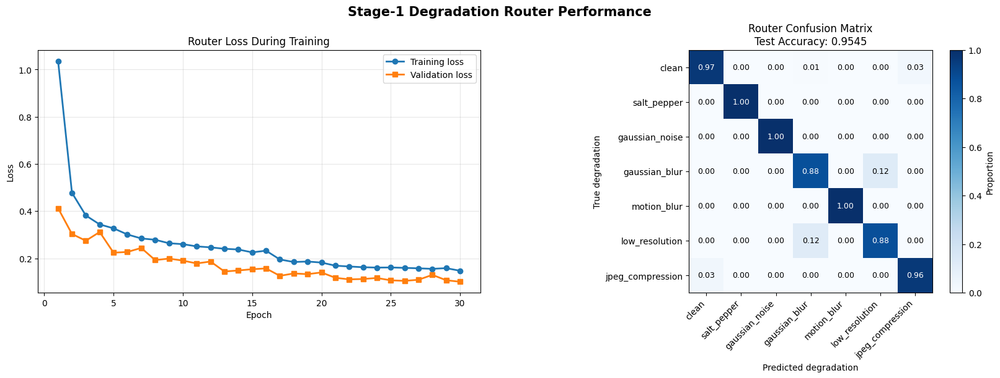

In [31]:
router_normalized_confusion = (
    router_confusion_matrix
    / router_confusion_matrix.sum(axis=1, keepdims=True)
)

figure, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6),
    constrained_layout=True,
)

axes[0].plot(
    router_history["epoch"],
    router_history["training_loss"],
    marker="o",
    linewidth=2,
    label="Training loss",
)

axes[0].plot(
    router_history["epoch"],
    router_history["validation_loss"],
    marker="s",
    linewidth=2,
    label="Validation loss",
)

axes[0].set_title("Router Loss During Training")
axes[0].set_xlabel("Epoch")
axes[0].set_ylabel("Loss")
axes[0].grid(alpha=0.3)
axes[0].legend()

confusion_image = axes[1].imshow(
    router_normalized_confusion,
    cmap="Blues",
    vmin=0,
    vmax=1,
)

axes[1].set_title(
    f"Router Confusion Matrix\nTest Accuracy: {router_test_accuracy:.4f}"
)
axes[1].set_xlabel("Predicted degradation")
axes[1].set_ylabel("True degradation")

axes[1].set_xticks(range(len(DEGRADATION_NAMES)))
axes[1].set_yticks(range(len(DEGRADATION_NAMES)))

axes[1].set_xticklabels(
    DEGRADATION_NAMES,
    rotation=45,
    ha="right",
)

axes[1].set_yticklabels(DEGRADATION_NAMES)

for true_index in range(len(DEGRADATION_NAMES)):
    for predicted_index in range(len(DEGRADATION_NAMES)):
        value = router_normalized_confusion[
            true_index,
            predicted_index,
        ]

        axes[1].text(
            predicted_index,
            true_index,
            f"{value:.2f}",
            ha="center",
            va="center",
            color="white" if value > 0.50 else "black",
            fontsize=9,
        )

figure.colorbar(
    confusion_image,
    ax=axes[1],
    fraction=0.046,
    pad=0.04,
    label="Proportion",
)

figure.suptitle(
    "Stage-1 Degradation Router Performance",
    fontsize=15,
    fontweight="bold",
)

plt.show()

# Phase 7 — Stage-2 Expert Binary Classifiers

## 7.1 Stage-2 expert training

Stage-2 expert training creates one binary real/fake classifier for each degradation category. Each expert is trained only on images assigned to its own degradation type, allowing it to specialise in the visual artefacts, noise patterns and failure modes of that condition. This is the stage that gives the routed system a chance to outperform the unified model: instead of forcing one classifier to handle every degradation equally, the router can later send each image to the expert most suited to its predicted degradation.

In [32]:
CFG["expert_epochs"] = 30
CFG["expert_patience"] = 5
CFG["expert_learning_rate"] = 1e-3
CFG["expert_batch_size"] = 512


def create_binary_expert_head(input_features):
    expert = nn.Sequential(
        nn.Linear(input_features, 512),
        nn.BatchNorm1d(512),
        nn.ReLU(inplace=True),
        nn.Dropout(0.30),

        nn.Linear(512, 128),
        nn.BatchNorm1d(128),
        nn.ReLU(inplace=True),
        nn.Dropout(0.40),

        nn.Linear(128, 2),
    )

    expert.apply(initialize_classification_head)
    return expert.to(CFG["device"])


@torch.no_grad()
def evaluate_binary_feature_classifier(model, data_loader):
    model.eval()

    criterion = nn.CrossEntropyLoss()
    total_loss = 0.0
    all_labels = []
    all_probabilities = []

    for features, labels in data_loader:
        features = features.to(CFG["device"], non_blocking=True)
        labels = labels.to(CFG["device"], non_blocking=True)

        logits = model(features)
        loss = criterion(logits, labels)

        probabilities = torch.softmax(logits, dim=1)[:, 1]

        total_loss += loss.item() * features.size(0)
        all_labels.extend(labels.cpu().numpy())
        all_probabilities.extend(probabilities.cpu().numpy())

    labels = np.asarray(all_labels)
    probabilities = np.asarray(all_probabilities)
    predictions = (probabilities >= 0.5).astype(int)

    precision, recall, f1, _ = precision_recall_fscore_support(
        labels,
        predictions,
        average="binary",
        zero_division=0,
    )

    return {
        "loss": total_loss / len(data_loader.dataset),
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc_score(labels, probabilities),
    }


def train_binary_expert(model, train_loader, validation_loader):
    criterion = nn.CrossEntropyLoss()

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=CFG["expert_learning_rate"],
        weight_decay=CFG["weight_decay"],
    )

    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=CFG["scheduler_factor"],
        patience=CFG["scheduler_patience"],
        min_lr=CFG["minimum_learning_rate"],
    )

    best_validation_loss = float("inf")
    best_epoch = 0
    best_state = {
        name: parameter.detach().cpu().clone()
        for name, parameter in model.state_dict().items()
    }

    epochs_without_improvement = 0
    history = []

    for epoch in range(1, CFG["expert_epochs"] + 1):
        model.train()
        total_training_loss = 0.0

        for features, labels in train_loader:
            features = features.to(CFG["device"], non_blocking=True)
            labels = labels.to(CFG["device"], non_blocking=True)

            optimizer.zero_grad(set_to_none=True)

            logits = model(features)
            loss = criterion(logits, labels)

            loss.backward()
            optimizer.step()

            total_training_loss += loss.item() * features.size(0)

        training_loss = total_training_loss / len(train_loader.dataset)

        validation_metrics = evaluate_binary_feature_classifier(
            model,
            validation_loader,
        )

        current_learning_rate = optimizer.param_groups[0]["lr"]

        history.append({
            "epoch": epoch,
            "training_loss": training_loss,
            "learning_rate": current_learning_rate,
            **{
                f"validation_{metric}": value
                for metric, value in validation_metrics.items()
            },
        })

        scheduler.step(validation_metrics["loss"])

        improvement = best_validation_loss - validation_metrics["loss"]

        if improvement > CFG.get("minimum_improvement", 1e-4):
            best_validation_loss = validation_metrics["loss"]
            best_epoch = epoch
            best_state = {
                name: parameter.detach().cpu().clone()
                for name, parameter in model.state_dict().items()
            }
            epochs_without_improvement = 0
        else:
            epochs_without_improvement += 1

        if epochs_without_improvement >= CFG["expert_patience"]:
            break

    model.load_state_dict(best_state)

    best_metrics = evaluate_binary_feature_classifier(
        model,
        validation_loader,
    )
    best_metrics["best_epoch"] = best_epoch

    return model, pd.DataFrame(history), best_metrics


expert_models = {}
expert_histories = {}
expert_validation_results = []

for degradation_class, degradation_name in enumerate(DEGRADATION_NAMES):
    train_mask = train_degradation_labels == degradation_class
    validation_mask = validation_degradation_labels == degradation_class

    train_expert_dataset = TensorDataset(
        train_features[train_mask],
        train_binary_labels[train_mask].long(),
    )

    validation_expert_dataset = TensorDataset(
        validation_features[validation_mask],
        validation_binary_labels[validation_mask].long(),
    )

    train_expert_loader = DataLoader(
        train_expert_dataset,
        batch_size=CFG["expert_batch_size"],
        shuffle=True,
        generator=create_generator(
            final_training_seed + degradation_class
        ),
    )

    validation_expert_loader = DataLoader(
        validation_expert_dataset,
        batch_size=CFG["expert_batch_size"],
        shuffle=False,
    )

    print(f"\nTraining expert: {degradation_name}")

    expert_model = create_binary_expert_head(feature_dimension)

    expert_model, expert_history, expert_metrics = train_binary_expert(
        expert_model,
        train_expert_loader,
        validation_expert_loader,
    )

    expert_models[degradation_class] = expert_model
    expert_histories[degradation_name] = expert_history

    expert_metrics.update({
        "degradation_class": degradation_class,
        "degradation_name": degradation_name,
        "training_samples": len(train_expert_dataset),
        "validation_samples": len(validation_expert_dataset),
    })

    expert_validation_results.append(expert_metrics)

    torch.save(
        {
            "model_type": "binary_expert",
            "degradation_class": degradation_class,
            "degradation_name": degradation_name,
            "feature_dimension": feature_dimension,
            "seed": final_training_seed,
            "validation_metrics": expert_metrics,
            "model_state_dict": {
                name: parameter.detach().cpu()
                for name, parameter
                in expert_model.state_dict().items()
            },
        },
        checkpoint_dir / f"expert_{degradation_name}.pt",
    )

expert_validation_df = pd.DataFrame(expert_validation_results)

expert_validation_df.to_csv(
    results_dir / "expert_validation_results.csv",
    index=False,
)

display(expert_validation_df)


Training expert: clean

Training expert: salt_pepper

Training expert: gaussian_noise

Training expert: gaussian_blur

Training expert: motion_blur

Training expert: low_resolution

Training expert: jpeg_compression


,loss,accuracy,precision,recall,f1,roc_auc,best_epoch,degradation_class,degradation_name,training_samples,validation_samples
0,0.015421,0.9940,0.994018,0.994018,0.994018,0.999892,6,0,clean,16000,2000
1,0.052745,0.9805,0.974310,0.988417,0.981313,0.998588,5,1,salt_pepper,16000,2000
2,0.043591,0.9855,0.986882,0.983903,0.985390,0.998831,5,2,gaussian_noise,16000,2000
3,0.030508,0.9895,0.988024,0.990991,0.989505,0.999489,4,3,gaussian_blur,16000,2000
4,0.026255,0.9915,0.990816,0.991828,0.991322,0.999700,12,4,motion_blur,16000,2000
5,0.054076,0.9815,0.984552,0.977505,0.981016,0.998442,11,5,low_resolution,16000,2000
6,0.068086,0.9770,0.974435,0.980218,0.977318,0.997675,3,6,jpeg_compression,16000,2000


## 7.2 Expert Validation Results and Learning Curves

Expert validation analysis checks whether each specialised binary classifier learned its own degradation condition effectively before the full routed system is evaluated. The grouped bar chart compares accuracy, F1 and ROC-AUC across all seven experts, while the validation-loss curves show whether any expert is undertrained, overfitting or stopping too early. This helps explain later end-to-end results because weak routed performance may come from either router mistakes or from individual experts that are not strong enough for their assigned degradation type.

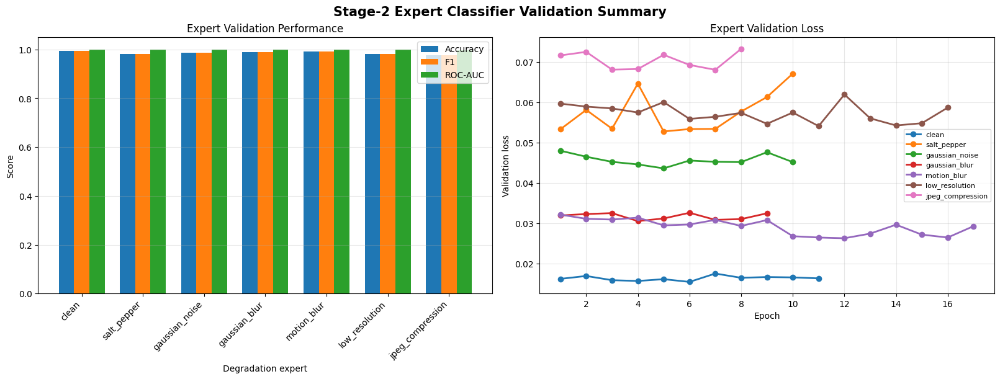

,degradation_name,training_samples,validation_samples,loss,accuracy,precision,recall,f1,roc_auc,best_epoch
0,clean,16000,2000,0.015421,0.9940,0.994018,0.994018,0.994018,0.999892,6
1,salt_pepper,16000,2000,0.052745,0.9805,0.974310,0.988417,0.981313,0.998588,5
2,gaussian_noise,16000,2000,0.043591,0.9855,0.986882,0.983903,0.985390,0.998831,5
3,gaussian_blur,16000,2000,0.030508,0.9895,0.988024,0.990991,0.989505,0.999489,4
4,motion_blur,16000,2000,0.026255,0.9915,0.990816,0.991828,0.991322,0.999700,12
5,low_resolution,16000,2000,0.054076,0.9815,0.984552,0.977505,0.981016,0.998442,11
6,jpeg_compression,16000,2000,0.068086,0.9770,0.974435,0.980218,0.977318,0.997675,3


In [33]:
expert_plot_df = expert_validation_df.sort_values(
    "degradation_class"
).reset_index(drop=True)

figure, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6),
    constrained_layout=True,
)

x_positions = np.arange(len(expert_plot_df))
bar_width = 0.25

axes[0].bar(
    x_positions - bar_width,
    expert_plot_df["accuracy"],
    width=bar_width,
    label="Accuracy",
)

axes[0].bar(
    x_positions,
    expert_plot_df["f1"],
    width=bar_width,
    label="F1",
)

axes[0].bar(
    x_positions + bar_width,
    expert_plot_df["roc_auc"],
    width=bar_width,
    label="ROC-AUC",
)

axes[0].set_title("Expert Validation Performance")
axes[0].set_xlabel("Degradation expert")
axes[0].set_ylabel("Score")
axes[0].set_ylim(0, 1.05)
axes[0].set_xticks(x_positions)
axes[0].set_xticklabels(
    expert_plot_df["degradation_name"],
    rotation=45,
    ha="right",
)
axes[0].grid(axis="y", alpha=0.3)
axes[0].legend()

for degradation_name, history in expert_histories.items():
    axes[1].plot(
        history["epoch"],
        history["validation_loss"],
        marker="o",
        linewidth=2,
        label=degradation_name,
    )

axes[1].set_title("Expert Validation Loss")
axes[1].set_xlabel("Epoch")
axes[1].set_ylabel("Validation loss")
axes[1].grid(alpha=0.3)
axes[1].legend(fontsize=8)

figure.suptitle(
    "Stage-2 Expert Classifier Validation Summary",
    fontsize=15,
    fontweight="bold",
)

plt.show()

display(
    expert_plot_df[
        [
            "degradation_name",
            "training_samples",
            "validation_samples",
            "loss",
            "accuracy",
            "precision",
            "recall",
            "f1",
            "roc_auc",
            "best_epoch",
        ]
    ]
)

# Phase 8 — Baseline Reintroduction

## 8.1 Clean-Only Baseline Training

Clean-only baseline training reintroduces the baseline model trained only on undegraded images. This gives the final comparison a weaker but important reference point: it shows how much performance is lost when a detector trained on clean faces is exposed to degraded test images. This GPU-saving version keeps the same selected backbone, optimizer and learning rate, and caps the image-model epoch budget at 11 to match the selected unified-backbone run.


In [34]:
CFG["clean_only_epochs"] = CFG["fixed_best_epoch"]
CFG["clean_only_patience"] = CFG["fixed_best_epoch"]

clean_training_seed = CFG["fixed_training_seed"]

clean_train_df = train_df[
    train_df["degradation_class"] == 0
].copy().reset_index(drop=True)

clean_validation_df = validation_df[
    validation_df["degradation_class"] == 0
].copy().reset_index(drop=True)

clean_train_dataset = DegradedFaceDataset(
    clean_train_df,
    transform=train_transform,
)

clean_validation_dataset = DegradedFaceDataset(
    clean_validation_df,
    transform=evaluation_transform,
)

clean_train_loader = DataLoader(
    clean_train_dataset,
    shuffle=True,
    generator=create_generator(clean_training_seed),
    **pilot_loader_settings,
)

clean_validation_loader = DataLoader(
    clean_validation_dataset,
    shuffle=False,
    **pilot_loader_settings,
)

clean_only_model = build_backbone(
    backbone_name=selected_backbone,
    seed=clean_training_seed,
)

(
    clean_only_model,
    clean_only_history,
    clean_only_validation_metrics,
) = train_backbone_model(
    model=clean_only_model,
    train_loader=clean_train_loader,
    validation_loader=clean_validation_loader,
    learning_rate=selected_learning_rate,
    max_epochs=CFG["clean_only_epochs"],
    patience=CFG["clean_only_patience"],
)

clean_only_checkpoint = (
    checkpoint_dir
    / f"clean_only_{selected_backbone}_seed_{clean_training_seed}.pt"
)

torch.save(
    {
        "model_type": "clean_only_baseline",
        "backbone_name": selected_backbone,
        "seed": clean_training_seed,
        "image_size": CFG["image_size"],
        "learning_rate": selected_learning_rate,
        "validation_metrics": clean_only_validation_metrics,
        "model_state_dict": {
            name: parameter.detach().cpu()
            for name, parameter
            in clean_only_model.state_dict().items()
        },
    },
    clean_only_checkpoint,
)

clean_only_history.to_csv(
    results_dir / "clean_only_training_history.csv",
    index=False,
)

display(
    pd.DataFrame(
        [clean_only_validation_metrics],
        index=["Clean-only validation"],
    )
)

print("Clean-only training samples:", len(clean_train_dataset))
print("Clean-only validation samples:", len(clean_validation_dataset))
print("Epoch budget:", CFG["clean_only_epochs"])
print("Best epoch:", clean_only_validation_metrics["best_epoch"])
print("Checkpoint:", clean_only_checkpoint)


/tmp/ipykernel_841/3174838853.py:91: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(


Epoch 1/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 01 | Train loss: 0.4864 | Val loss: 0.2413 | Accuracy: 0.9040 | F1: 0.9065 | AUC: 0.9669 | LR: 1.00e-04


Epoch 2/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 02 | Train loss: 0.2133 | Val loss: 0.1416 | Accuracy: 0.9465 | F1: 0.9464 | AUC: 0.9876 | LR: 1.00e-04


Epoch 3/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 03 | Train loss: 0.1442 | Val loss: 0.1693 | Accuracy: 0.9345 | F1: 0.9381 | AUC: 0.9937 | LR: 1.00e-04


Epoch 4/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 04 | Train loss: 0.1119 | Val loss: 0.0972 | Accuracy: 0.9605 | F1: 0.9595 | AUC: 0.9958 | LR: 1.00e-04


Epoch 5/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 05 | Train loss: 0.0912 | Val loss: 0.0927 | Accuracy: 0.9675 | F1: 0.9669 | AUC: 0.9958 | LR: 1.00e-04


Epoch 6/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 06 | Train loss: 0.0813 | Val loss: 0.1502 | Accuracy: 0.9430 | F1: 0.9460 | AUC: 0.9964 | LR: 1.00e-04


Epoch 7/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 07 | Train loss: 0.0704 | Val loss: 0.0786 | Accuracy: 0.9710 | F1: 0.9704 | AUC: 0.9973 | LR: 1.00e-04


Epoch 8/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 08 | Train loss: 0.0582 | Val loss: 0.0662 | Accuracy: 0.9785 | F1: 0.9784 | AUC: 0.9972 | LR: 1.00e-04


Epoch 9/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 09 | Train loss: 0.0537 | Val loss: 0.0654 | Accuracy: 0.9740 | F1: 0.9739 | AUC: 0.9971 | LR: 1.00e-04


Epoch 10/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 10 | Train loss: 0.0485 | Val loss: 0.0837 | Accuracy: 0.9695 | F1: 0.9703 | AUC: 0.9974 | LR: 1.00e-04


Epoch 11/11:   0%|          | 0/250 [00:00<?, ?it/s]

/tmp/ipykernel_841/3174838853.py:127: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(
/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Epoch 11 | Train loss: 0.0499 | Val loss: 0.0462 | Accuracy: 0.9810 | F1: 0.9809 | AUC: 0.9985 | LR: 1.00e-04


/tmp/ipykernel_841/3174838853.py:25: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


,loss,accuracy,precision,recall,f1,roc_auc,best_epoch
Clean-only validation,0.046206,0.981,0.989848,0.972084,0.980885,0.998523,11


Clean-only training samples: 16000
Clean-only validation samples: 2000
Epoch budget: 11
Best epoch: 11
Checkpoint: checkpoints_post_tuning/clean_only_resnet18_seed_1.pt


## 8.2 End-to-End Evaluation of Unified, Clean-Only, Routed and Oracle Systems

End-to-end system evaluation compares the four main systems on the same test set: the unified model, the clean-only baseline, the routed expert system and the oracle expert system. The routed system uses the Stage-1 router’s predicted degradation class to select an expert, while the oracle system uses the true degradation label and therefore acts as the upper-bound expert-routing result. Comparing routed against oracle measures the cost of routing mistakes, while comparing routed against unified shows whether degradation-specialised experts improve real/fake classification beyond a single robust classifier.

In [35]:
final_test_image_loader = DataLoader(
    test_dataset,
    shuffle=False,
    **pilot_loader_settings,
)


@torch.no_grad()
def predict_image_binary_classifier(model, data_loader):
    model.eval()

    all_labels = []
    all_probabilities = []

    use_mixed_precision = CFG["device"] == "cuda"

    for images, binary_labels, _, _ in tqdm(
        data_loader,
        desc="Predicting image model",
        leave=False,
    ):
        images = images.to(CFG["device"], non_blocking=True)

        with torch.cuda.amp.autocast(
            enabled=use_mixed_precision
        ):
            logits = model(images)

        probabilities = torch.softmax(
            logits.float(),
            dim=1,
        )[:, 1]

        all_labels.extend(binary_labels.cpu().numpy())
        all_probabilities.extend(probabilities.cpu().numpy())

    return np.asarray(all_labels), np.asarray(all_probabilities)


@torch.no_grad()
def predict_expert_probability_matrix(expert_models, features):
    probability_columns = []

    feature_dataset = TensorDataset(features)

    feature_loader = DataLoader(
        feature_dataset,
        batch_size=CFG["expert_batch_size"],
        shuffle=False,
    )

    for degradation_class in range(len(DEGRADATION_NAMES)):
        expert = expert_models[degradation_class]
        expert.eval()

        class_probabilities = []

        for (batch_features,) in feature_loader:
            batch_features = batch_features.to(
                CFG["device"],
                non_blocking=True,
            )

            logits = expert(batch_features)

            probabilities = torch.softmax(
                logits,
                dim=1,
            )[:, 1]

            class_probabilities.extend(
                probabilities.cpu().numpy()
            )

        probability_columns.append(class_probabilities)

    return np.asarray(probability_columns).T


def calculate_binary_metrics(labels, probabilities):
    predictions = (probabilities >= 0.5).astype(int)

    precision, recall, f1, _ = precision_recall_fscore_support(
        labels,
        predictions,
        average="binary",
        zero_division=0,
    )

    return {
        "accuracy": accuracy_score(labels, predictions),
        "precision": precision,
        "recall": recall,
        "f1": f1,
        "roc_auc": roc_auc_score(labels, probabilities),
    }


def evaluate_system_by_degradation(
    system_name,
    labels,
    probabilities,
    degradation_labels,
):
    rows = []

    evaluation_groups = [("ALL", np.ones(len(labels), dtype=bool))]

    for degradation_class, degradation_name in enumerate(DEGRADATION_NAMES):
        evaluation_groups.append(
            (
                degradation_name,
                degradation_labels == degradation_class,
            )
        )

    for degradation_name, mask in evaluation_groups:
        group_labels = labels[mask]
        group_probabilities = probabilities[mask]

        metrics = calculate_binary_metrics(
            group_labels,
            group_probabilities,
        )

        rows.append({
            "system": system_name,
            "degradation_name": degradation_name,
            "samples": int(mask.sum()),
            **metrics,
        })

    return rows


test_labels_from_unified, unified_test_probabilities = (
    predict_image_binary_classifier(
        unified_model,
        final_test_image_loader,
    )
)

test_labels_from_clean, clean_only_test_probabilities = (
    predict_image_binary_classifier(
        clean_only_model,
        final_test_image_loader,
    )
)

test_labels = test_binary_labels.numpy()
test_degradations = test_degradation_labels.numpy()

assert np.array_equal(test_labels_from_unified, test_labels)
assert np.array_equal(test_labels_from_clean, test_labels)

expert_probability_matrix = predict_expert_probability_matrix(
    expert_models,
    test_features,
)

oracle_test_probabilities = expert_probability_matrix[
    np.arange(len(test_features)),
    test_degradations,
]

routed_test_probabilities = expert_probability_matrix[
    np.arange(len(test_features)),
    router_test_predictions,
]

end_to_end_rows = []

for system_name, probabilities in [
    ("unified", unified_test_probabilities),
    ("clean_only", clean_only_test_probabilities),
    ("oracle", oracle_test_probabilities),
    ("routed", routed_test_probabilities),
]:
    end_to_end_rows.extend(
        evaluate_system_by_degradation(
            system_name=system_name,
            labels=test_labels,
            probabilities=probabilities,
            degradation_labels=test_degradations,
        )
    )

end_to_end_results_df = pd.DataFrame(end_to_end_rows)

end_to_end_results_df.to_csv(
    results_dir / "end_to_end_system_comparison.csv",
    index=False,
)

display(
    end_to_end_results_df.pivot(
        index="degradation_name",
        columns="system",
        values="accuracy",
    ).round(4)
)

display(end_to_end_results_df)

print("End-to-end evaluation complete.")

Predicting image model:   0%|          | 0/219 [00:00<?, ?it/s]

/tmp/ipykernel_841/179031645.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(


Predicting image model:   0%|          | 0/219 [00:00<?, ?it/s]

system,clean_only,oracle,routed,unified
degradation_name,,,,
ALL,0.7058,0.9843,0.9842,0.9811
clean,0.9810,0.9935,0.9935,0.9920
gaussian_blur,0.6675,0.9875,0.9875,0.9830
gaussian_noise,0.6630,0.9810,0.9805,0.9770
jpeg_compression,0.8420,0.9775,0.9775,0.9775
low_resolution,0.6490,0.9815,0.9815,0.9745
motion_blur,0.6130,0.9910,0.9910,0.9835
salt_pepper,0.5250,0.9780,0.9780,0.9805


,system,degradation_name,samples,accuracy,precision,recall,f1,roc_auc
0,unified,ALL,14000,0.981143,0.975706,0.986857,0.981250,0.998598
1,unified,clean,2000,0.992000,0.987255,0.997030,0.992118,0.999574
2,unified,salt_pepper,2000,0.980500,0.979167,0.982090,0.980626,0.998310
3,unified,gaussian_noise,2000,0.977000,0.972195,0.981946,0.977046,0.998106
4,unified,gaussian_blur,2000,0.983000,0.977605,0.989163,0.983350,0.998696
5,unified,motion_blur,2000,0.983500,0.973373,0.993958,0.983558,0.999394
6,unified,low_resolution,2000,0.974500,0.964859,0.983623,0.974151,0.997984
7,unified,jpeg_compression,2000,0.977500,0.975198,0.980060,0.977623,0.997588
8,clean_only,ALL,14000,0.705786,0.963332,0.427857,0.592541,0.847514
9,clean_only,clean,2000,0.981000,0.984064,0.978218,0.981132,0.997994


End-to-end evaluation complete.


## 8.3 End-to-End Comparison Visualisation

End-to-end comparison visualisation turns the final system metrics into a direct side-by-side comparison across all degradation conditions. The clean-only model shows how poorly a detector trained only on clean images generalises to degraded inputs, the unified model represents the strongest single-classifier baseline, the oracle system shows the best possible expert selection when degradation labels are known, and the routed system shows the practical performance of the proposed two-stage model. This figure is the main visual evidence for whether post-tuning improved the routed expert pipeline beyond the original baseline.

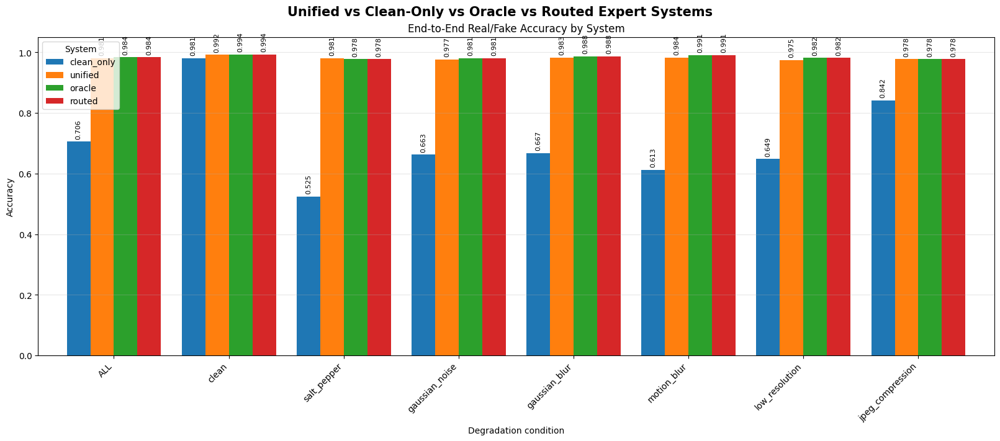

In [36]:
accuracy_pivot = end_to_end_results_df.pivot(
    index="degradation_name",
    columns="system",
    values="accuracy",
).loc[["ALL"] + DEGRADATION_NAMES]

system_order = [
    "clean_only",
    "unified",
    "oracle",
    "routed",
]

accuracy_pivot = accuracy_pivot[system_order]

figure, axis = plt.subplots(
    figsize=(16, 7),
    constrained_layout=True,
)

accuracy_pivot.plot(
    kind="bar",
    ax=axis,
    width=0.82,
)

axis.set_title("End-to-End Real/Fake Accuracy by System")
axis.set_xlabel("Degradation condition")
axis.set_ylabel("Accuracy")
axis.set_ylim(0, 1.05)
axis.grid(axis="y", alpha=0.3)
axis.legend(title="System")

axis.set_xticklabels(
    accuracy_pivot.index,
    rotation=45,
    ha="right",
)

for container in axis.containers:
    axis.bar_label(
        container,
        fmt="%.3f",
        fontsize=8,
        rotation=90,
        padding=3,
    )

figure.suptitle(
    "Unified vs Clean-Only vs Oracle vs Routed Expert Systems",
    fontsize=15,
    fontweight="bold",
)

plt.show()

## 8.4 Routed vs Oracle Gap Analysis

Routed-oracle gap analysis quantifies how much performance is lost when the system uses the router’s predicted degradation class instead of the true degradation label. The oracle result represents the upper bound of the expert system because it always selects the correct expert, while the routed result reflects the practical two-stage pipeline. Comparing routed against unified shows whether expert specialisation improves real/fake classification beyond a single robust classifier, and comparing routed against oracle shows whether remaining errors are mainly caused by misrouting.

In [37]:
gap_pivot = end_to_end_results_df.pivot(
    index="degradation_name",
    columns="system",
    values="accuracy",
)

gap_analysis_df = pd.DataFrame({
    "degradation_name": gap_pivot.index,
    "oracle_accuracy": gap_pivot["oracle"].values,
    "routed_accuracy": gap_pivot["routed"].values,
    "unified_accuracy": gap_pivot["unified"].values,
    "oracle_minus_routed": (
        gap_pivot["oracle"] - gap_pivot["routed"]
    ).values,
    "routed_minus_unified": (
        gap_pivot["routed"] - gap_pivot["unified"]
    ).values,
}).reset_index(drop=True)

gap_analysis_df = gap_analysis_df[
    [
        "degradation_name",
        "oracle_accuracy",
        "routed_accuracy",
        "unified_accuracy",
        "oracle_minus_routed",
        "routed_minus_unified",
    ]
]

gap_analysis_df.to_csv(
    results_dir / "routed_oracle_gap_analysis.csv",
    index=False,
)

display(gap_analysis_df.round(4))

print(
    "Overall oracle-routed gap:",
    gap_analysis_df.loc[
        gap_analysis_df["degradation_name"] == "ALL",
        "oracle_minus_routed",
    ].iloc[0].round(4),
)

print(
    "Overall routed-unified difference:",
    gap_analysis_df.loc[
        gap_analysis_df["degradation_name"] == "ALL",
        "routed_minus_unified",
    ].iloc[0].round(4),
)

,degradation_name,oracle_accuracy,routed_accuracy,unified_accuracy,oracle_minus_routed,routed_minus_unified
0,ALL,0.9843,0.9842,0.9811,0.0001,0.0031
1,clean,0.9935,0.9935,0.9920,0.0000,0.0015
2,gaussian_blur,0.9875,0.9875,0.9830,0.0000,0.0045
3,gaussian_noise,0.9810,0.9805,0.9770,0.0005,0.0035
4,jpeg_compression,0.9775,0.9775,0.9775,0.0000,0.0000
5,low_resolution,0.9815,0.9815,0.9745,0.0000,0.0070
6,motion_blur,0.9910,0.9910,0.9835,0.0000,0.0075
7,salt_pepper,0.9780,0.9780,0.9805,0.0000,-0.0025


Overall oracle-routed gap: 0.0001
Overall routed-unified difference: 0.0031


## 8.5 Routed vs Oracle Gap Visualisation

Routing-gap visualisation makes the final routed-system behaviour easier to interpret. The first chart shows how far the practical routed system is from the oracle upper bound, so larger positive bars indicate performance lost through incorrect expert selection. The second chart compares the routed system directly against the unified model, where positive bars mean expert routing outperformed the single unified classifier and negative bars mean the unified model remained stronger. Together, these plots explain both the cost of routing errors and whether expert specialisation actually improved the final real/fake detection task.

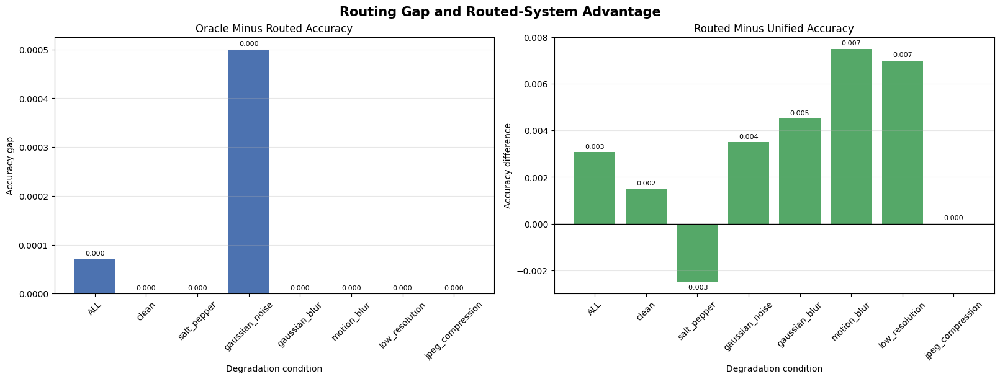

In [38]:
gap_plot_df = gap_analysis_df.set_index(
    "degradation_name"
).loc[["ALL"] + DEGRADATION_NAMES]

figure, axes = plt.subplots(
    1,
    2,
    figsize=(16, 6),
    constrained_layout=True,
)

axes[0].bar(
    gap_plot_df.index,
    gap_plot_df["oracle_minus_routed"],
    color="#4C72B0",
)

axes[0].axhline(
    0,
    color="black",
    linewidth=1,
)

axes[0].set_title("Oracle Minus Routed Accuracy")
axes[0].set_xlabel("Degradation condition")
axes[0].set_ylabel("Accuracy gap")
axes[0].tick_params(axis="x", rotation=45)
axes[0].grid(axis="y", alpha=0.3)

axes[1].bar(
    gap_plot_df.index,
    gap_plot_df["routed_minus_unified"],
    color="#55A868",
)

axes[1].axhline(
    0,
    color="black",
    linewidth=1,
)

axes[1].set_title("Routed Minus Unified Accuracy")
axes[1].set_xlabel("Degradation condition")
axes[1].set_ylabel("Accuracy difference")
axes[1].tick_params(axis="x", rotation=45)
axes[1].grid(axis="y", alpha=0.3)

for axis in axes:
    for container in axis.containers:
        axis.bar_label(
            container,
            fmt="%.3f",
            fontsize=8,
            padding=3,
        )

figure.suptitle(
    "Routing Gap and Routed-System Advantage",
    fontsize=15,
    fontweight="bold",
)

plt.show()

## 8.6 Severity-Based Evaluation

Severity-based evaluation measures how each system performs as degradation strength changes within each degradation category. This is important because overall accuracy can hide whether the model is only robust to mild degradation or remains reliable under more severe corruption such as high blur, low resolution or heavy JPEG compression. Comparing unified, clean-only, oracle and routed results at each severity level provides a clearer view of where expert routing helps and where the system still fails under stronger image degradation.

In [39]:
severity_rows = []

severity_values = np.sort(
    pd.Series(test_severities.numpy()).unique()
)

system_probabilities = {
    "unified": unified_test_probabilities,
    "clean_only": clean_only_test_probabilities,
    "oracle": oracle_test_probabilities,
    "routed": routed_test_probabilities,
}

for degradation_class, degradation_name in enumerate(DEGRADATION_NAMES):
    degradation_mask = test_degradations == degradation_class

    for severity in np.sort(
        pd.Series(
            test_severities.numpy()[degradation_mask]
        ).unique()
    ):
        severity_mask = (
            degradation_mask
            & (test_severities.numpy() == severity)
        )

        if severity_mask.sum() == 0:
            continue

        for system_name, probabilities in system_probabilities.items():
            metrics = calculate_binary_metrics(
                labels=test_labels[severity_mask],
                probabilities=probabilities[severity_mask],
            )

            severity_rows.append({
                "degradation_class": degradation_class,
                "degradation_name": degradation_name,
                "severity": severity,
                "system": system_name,
                "samples": int(severity_mask.sum()),
                **metrics,
            })

severity_results_df = pd.DataFrame(severity_rows)

severity_results_df.to_csv(
    results_dir / "severity_based_system_comparison.csv",
    index=False,
)

display(severity_results_df.round(4))

,degradation_class,degradation_name,severity,system,samples,accuracy,precision,recall,f1,roc_auc
0,0,clean,0.00,unified,2000,0.9920,0.9873,0.9970,0.9921,0.9996
1,0,clean,0.00,clean_only,2000,0.9810,0.9841,0.9782,0.9811,0.9980
2,0,clean,0.00,oracle,2000,0.9935,0.9902,0.9970,0.9936,0.9996
3,0,clean,0.00,routed,2000,0.9935,0.9902,0.9970,0.9936,0.9996
4,1,salt_pepper,0.02,unified,667,0.9835,0.9824,0.9853,0.9838,0.9989
...,...,...,...,...,...,...,...,...,...,...
71,6,jpeg_compression,40.00,routed,667,0.9850,0.9800,0.9913,0.9856,0.9995
72,6,jpeg_compression,70.00,unified,667,0.9805,0.9796,0.9825,0.9810,0.9987
73,6,jpeg_compression,70.00,clean_only,667,0.9685,0.9652,0.9737,0.9694,0.9970
74,6,jpeg_compression,70.00,oracle,667,0.9835,0.9825,0.9854,0.9839,0.9990


## 8.7 Severity-Based Performance Visualisation

Severity-performance visualisation shows whether each system remains stable as degradation severity increases. Plotting unified, clean-only, oracle and routed accuracy separately for each degradation category makes it easier to identify where expert routing is most useful, where the clean-only baseline collapses, and where the routed system falls behind the oracle upper bound. This final robustness view strengthens the analysis because it explains not only which system performs best overall, but also under which degradation conditions and severity levels that advantage appears.

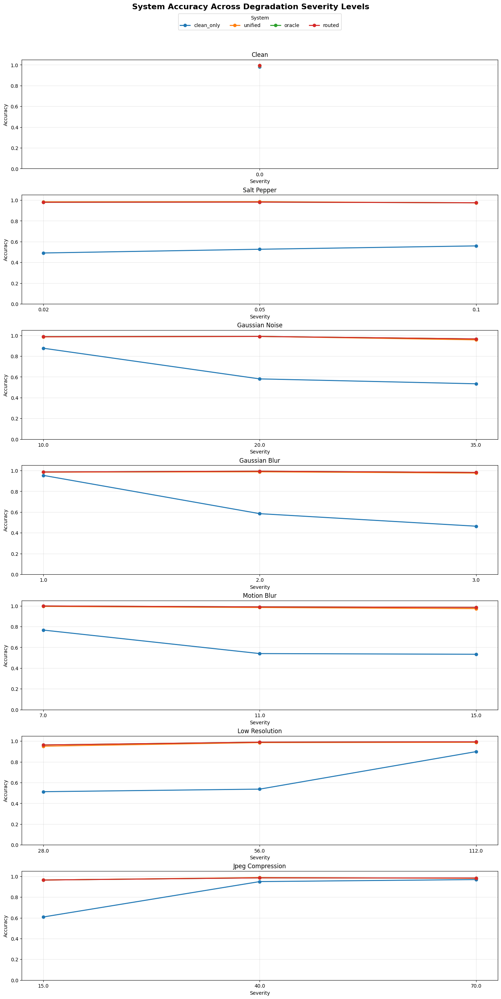

In [40]:
severity_plot_df = severity_results_df.copy()

severity_plot_df["severity_label"] = severity_plot_df[
    "severity"
].astype(str)

figure, axes = plt.subplots(
    len(DEGRADATION_NAMES),
    1,
    figsize=(14, 28),
    sharey=True,
    constrained_layout=True,
)

for axis, degradation_name in zip(axes, DEGRADATION_NAMES):
    degradation_results = severity_plot_df[
        severity_plot_df["degradation_name"] == degradation_name
    ]

    for system_name in system_order:
        system_results = degradation_results[
            degradation_results["system"] == system_name
        ].sort_values("severity")

        axis.plot(
            system_results["severity_label"],
            system_results["accuracy"],
            marker="o",
            linewidth=2,
            label=system_name,
        )

    axis.set_title(
        degradation_name.replace("_", " ").title()
    )
    axis.set_xlabel("Severity")
    axis.set_ylabel("Accuracy")
    axis.set_ylim(0, 1.05)
    axis.grid(alpha=0.3)

axes[0].legend(
    title="System",
    loc="lower center",
    bbox_to_anchor=(0.5, 1.25),
    ncol=len(system_order),
)

figure.suptitle(
    "System Accuracy Across Degradation Severity Levels",
    fontsize=16,
    fontweight="bold",
)

plt.show()

# Phase 9 — Final Export and Reproducibility Summary

## 9.1 Final Results Summary

In [41]:
import json

final_summary = {
    "selected_backbone": selected_backbone,
    "final_training_seed": final_training_seed,
    "selected_learning_rate": selected_learning_rate,
    "final_backbone_epochs": CFG["final_backbone_epochs"],
    "final_backbone_patience": CFG["final_backbone_patience"],
    "fixed_best_epoch": CFG["fixed_best_epoch"],
    "router_epochs": CFG["router_epochs"],
    "router_patience": CFG["router_patience"],
    "expert_epochs": CFG["expert_epochs"],
    "expert_patience": CFG["expert_patience"],
    "feature_dimension": feature_dimension,
    "degradation_classes": DEGRADATION_NAMES,
    "unified_validation_metrics": unified_validation_metrics,
    "router_validation_metrics": router_validation_metrics,
    "clean_only_validation_metrics": clean_only_validation_metrics,
    "overall_end_to_end_accuracy": (
        end_to_end_results_df[
            end_to_end_results_df["degradation_name"] == "ALL"
        ]
        .set_index("system")["accuracy"]
        .to_dict()
    ),
    "overall_end_to_end_f1": (
        end_to_end_results_df[
            end_to_end_results_df["degradation_name"] == "ALL"
        ]
        .set_index("system")["f1"]
        .to_dict()
    ),
    "overall_end_to_end_roc_auc": (
        end_to_end_results_df[
            end_to_end_results_df["degradation_name"] == "ALL"
        ]
        .set_index("system")["roc_auc"]
        .to_dict()
    ),
    "checkpoints": {
        "unified": str(unified_checkpoint),
        "router": str(router_checkpoint),
        "clean_only": str(clean_only_checkpoint),
    },
    "result_files": sorted(
        str(path)
        for path in results_dir.glob("*")
    ),
}

with open(
    results_dir / "final_reproducibility_summary.json",
    "w",
) as file:
    json.dump(
        final_summary,
        file,
        indent=4,
        default=str,
    )

display(
    pd.DataFrame({
        "setting": [
            "Selected backbone",
            "Training seed",
            "Selected learning rate",
            "Feature dimension",
            "Unified best epoch",
            "Router best epoch",
            "Clean-only best epoch",
        ],
        "value": [
            selected_backbone,
            final_training_seed,
            selected_learning_rate,
            feature_dimension,
            unified_validation_metrics["best_epoch"],
            router_validation_metrics["best_epoch"],
            clean_only_validation_metrics["best_epoch"],
        ],
    })
)

display(
    end_to_end_results_df[
        end_to_end_results_df["degradation_name"] == "ALL"
    ][
        [
            "system",
            "accuracy",
            "precision",
            "recall",
            "f1",
            "roc_auc",
        ]
    ].round(4)
)

print("Final reproducibility summary saved to:")
print(results_dir / "final_reproducibility_summary.json")

,setting,value
0,Selected backbone,resnet18
1,Training seed,1
2,Selected learning rate,0.0001
3,Feature dimension,960
4,Unified best epoch,11
5,Router best epoch,30
6,Clean-only best epoch,11


,system,accuracy,precision,recall,f1,roc_auc
0,unified,0.9811,0.9757,0.9869,0.9812,0.9986
8,clean_only,0.7058,0.9633,0.4279,0.5925,0.8475
16,oracle,0.9843,0.9836,0.9850,0.9843,0.9988
24,routed,0.9842,0.9837,0.9847,0.9842,0.9987


Final reproducibility summary saved to:
results_post_tuning/final_reproducibility_summary.json


## 9.2 Baseline vs Post-Tuning Comparison

Baseline versus post-tuning comparison directly measures whether the new pipeline improved on the original experiment. The first table compares the final real/fake accuracy of the clean-only, unified, oracle and routed systems against the baseline notebook, while the second table compares the Stage-1 degradation-router accuracy before and after post-tuning. This step is important because the main claim of the notebook depends on showing not only strong final results, but also whether the post-tuning changes improved the original routing pipeline.

In [42]:
baseline_overall_metrics = pd.DataFrame([
    {
        "system": "clean_only",
        "baseline_accuracy": 0.6789,
    },
    {
        "system": "unified",
        "baseline_accuracy": 0.8904,
    },
    {
        "system": "oracle",
        "baseline_accuracy": 0.8893,
    },
    {
        "system": "routed",
        "baseline_accuracy": 0.8886,
    },
])

post_tuning_overall_metrics = (
    end_to_end_results_df[
        end_to_end_results_df["degradation_name"] == "ALL"
    ][
        [
            "system",
            "accuracy",
            "precision",
            "recall",
            "f1",
            "roc_auc",
        ]
    ]
    .rename(columns={"accuracy": "post_tuning_accuracy"})
    .reset_index(drop=True)
)

baseline_comparison_df = baseline_overall_metrics.merge(
    post_tuning_overall_metrics,
    on="system",
    how="left",
)

baseline_comparison_df["accuracy_change"] = (
    baseline_comparison_df["post_tuning_accuracy"]
    - baseline_comparison_df["baseline_accuracy"]
)

baseline_router_accuracy = 0.8629

router_accuracy_comparison_df = pd.DataFrame([
    {
        "metric": "Stage-1 degradation-router accuracy",
        "baseline": baseline_router_accuracy,
        "post_tuning": router_test_accuracy,
        "change": router_test_accuracy - baseline_router_accuracy,
    }
])

baseline_comparison_df.to_csv(
    results_dir / "baseline_vs_post_tuning_overall.csv",
    index=False,
)

router_accuracy_comparison_df.to_csv(
    results_dir / "baseline_vs_post_tuning_router.csv",
    index=False,
)

display(baseline_comparison_df.round(4))
display(router_accuracy_comparison_df.round(4))

print("Baseline comparison files saved.")

,system,baseline_accuracy,post_tuning_accuracy,precision,recall,f1,roc_auc,accuracy_change
0,clean_only,0.6789,0.7058,0.9633,0.4279,0.5925,0.8475,0.0269
1,unified,0.8904,0.9811,0.9757,0.9869,0.9812,0.9986,0.0907
2,oracle,0.8893,0.9843,0.9836,0.9850,0.9843,0.9988,0.0950
3,routed,0.8886,0.9842,0.9837,0.9847,0.9842,0.9987,0.0956


,metric,baseline,post_tuning,change
0,Stage-1 degradation-router accuracy,0.8629,0.9545,0.0916


Baseline comparison files saved.


## 9.3 Baseline vs Post-Tuning Visualisation

Baseline versus post-tuning visualisation presents the main improvement claim in a report-ready format. The first chart compares end-to-end real/fake accuracy for the clean-only, unified, oracle and routed systems before and after post-tuning, while the second chart focuses specifically on Stage-1 degradation-router accuracy. This separates two questions: whether the router itself improved, and whether that improvement translated into better final real/fake detection performance.

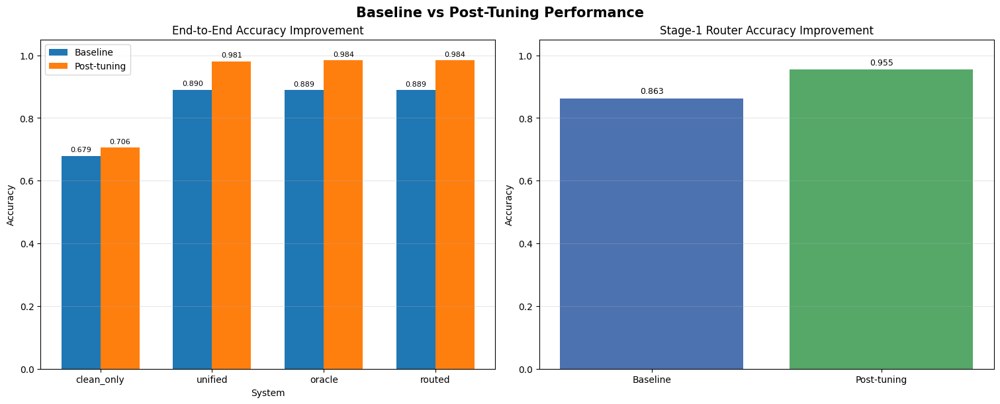

In [43]:
comparison_plot_df = baseline_comparison_df.set_index(
    "system"
).loc[system_order]

figure, axes = plt.subplots(
    1,
    2,
    figsize=(15, 6),
    constrained_layout=True,
)

x_positions = np.arange(len(comparison_plot_df))
bar_width = 0.35

axes[0].bar(
    x_positions - bar_width / 2,
    comparison_plot_df["baseline_accuracy"],
    width=bar_width,
    label="Baseline",
)

axes[0].bar(
    x_positions + bar_width / 2,
    comparison_plot_df["post_tuning_accuracy"],
    width=bar_width,
    label="Post-tuning",
)

axes[0].set_title("End-to-End Accuracy Improvement")
axes[0].set_xlabel("System")
axes[0].set_ylabel("Accuracy")
axes[0].set_ylim(0, 1.05)
axes[0].set_xticks(x_positions)
axes[0].set_xticklabels(comparison_plot_df.index)
axes[0].grid(axis="y", alpha=0.3)
axes[0].legend()

for container in axes[0].containers:
    axes[0].bar_label(
        container,
        fmt="%.3f",
        fontsize=8,
        padding=3,
    )

axes[1].bar(
    ["Baseline", "Post-tuning"],
    [
        router_accuracy_comparison_df.loc[
            0,
            "baseline",
        ],
        router_accuracy_comparison_df.loc[
            0,
            "post_tuning",
        ],
    ],
    color=["#4C72B0", "#55A868"],
)

axes[1].set_title("Stage-1 Router Accuracy Improvement")
axes[1].set_ylabel("Accuracy")
axes[1].set_ylim(0, 1.05)
axes[1].grid(axis="y", alpha=0.3)

for container in axes[1].containers:
    axes[1].bar_label(
        container,
        fmt="%.3f",
        fontsize=9,
        padding=3,
    )

figure.suptitle(
    "Baseline vs Post-Tuning Performance",
    fontsize=15,
    fontweight="bold",
)

plt.show()

## 9.4 Final Research-Question Summary

Final research-question summarisation converts the experiment outputs into the exact claims needed for the report. Instead of leaving the notebook as separate training logs, tables and figures, this cell links each result back to the original research questions: router accuracy for RQ1, routed-versus-unified performance for RQ2, oracle-routed gap for RQ3 and severity robustness for RQ4. This makes the final interpretation easier to write because the notebook now records both the numerical results and the meaning of those results.

In [44]:
overall_results = (
    end_to_end_results_df[
        end_to_end_results_df["degradation_name"] == "ALL"
    ]
    .set_index("system")
)

overall_routed_accuracy = overall_results.loc[
    "routed",
    "accuracy",
]

overall_unified_accuracy = overall_results.loc[
    "unified",
    "accuracy",
]

overall_oracle_accuracy = overall_results.loc[
    "oracle",
    "accuracy",
]

overall_clean_accuracy = overall_results.loc[
    "clean_only",
    "accuracy",
]

overall_oracle_gap = (
    overall_oracle_accuracy - overall_routed_accuracy
)

overall_routed_unified_difference = (
    overall_routed_accuracy - overall_unified_accuracy
)

routed_by_degradation = end_to_end_results_df[
    (end_to_end_results_df["system"] == "routed")
    & (end_to_end_results_df["degradation_name"] != "ALL")
].copy()

weakest_routed_degradation = routed_by_degradation.loc[
    routed_by_degradation["accuracy"].idxmin()
]

strongest_routed_degradation = routed_by_degradation.loc[
    routed_by_degradation["accuracy"].idxmax()
]

routed_severity_results = severity_results_df[
    severity_results_df["system"] == "routed"
].copy()

weakest_severity_condition = routed_severity_results.loc[
    routed_severity_results["accuracy"].idxmin()
]

final_rq_summary_df = pd.DataFrame([
    {
        "research_question": "RQ1",
        "focus": "Stage-1 degradation routing",
        "main_metric": "Router test accuracy",
        "result": router_test_accuracy,
        "interpretation": (
            "The router identifies degradation categories using "
            "multi-scale ResNet features."
        ),
    },
    {
        "research_question": "RQ2",
        "focus": "Routed system versus unified baseline",
        "main_metric": "Routed minus unified accuracy",
        "result": overall_routed_unified_difference,
        "interpretation": (
            "A positive value means the routed expert system "
            "outperformed the unified classifier."
        ),
    },
    {
        "research_question": "RQ3",
        "focus": "Cost of misrouting",
        "main_metric": "Oracle minus routed accuracy",
        "result": overall_oracle_gap,
        "interpretation": (
            "This gap estimates how much performance is lost when "
            "the router selects the wrong expert."
        ),
    },
    {
        "research_question": "RQ4",
        "focus": "Robustness under degradation severity",
        "main_metric": "Weakest routed severity accuracy",
        "result": weakest_severity_condition["accuracy"],
        "interpretation": (
            f"Weakest routed condition: "
            f"{weakest_severity_condition['degradation_name']} "
            f"at severity {weakest_severity_condition['severity']}."
        ),
    },
])

final_rq_summary_df.to_csv(
    results_dir / "final_research_question_summary.csv",
    index=False,
)

display(final_rq_summary_df.round(4))

print("Overall clean-only accuracy:", round(overall_clean_accuracy, 4))
print("Overall unified accuracy:", round(overall_unified_accuracy, 4))
print("Overall oracle accuracy:", round(overall_oracle_accuracy, 4))
print("Overall routed accuracy:", round(overall_routed_accuracy, 4))
print("Overall oracle-routed gap:", round(overall_oracle_gap, 4))
print(
    "Overall routed-unified difference:",
    round(overall_routed_unified_difference, 4),
)
print(
    "Weakest routed degradation:",
    weakest_routed_degradation["degradation_name"],
    round(weakest_routed_degradation["accuracy"], 4),
)
print(
    "Strongest routed degradation:",
    strongest_routed_degradation["degradation_name"],
    round(strongest_routed_degradation["accuracy"], 4),
)

,research_question,focus,main_metric,result,interpretation
0,RQ1,Stage-1 degradation routing,Router test accuracy,0.9545,The router identifies degradation categories u...
1,RQ2,Routed system versus unified baseline,Routed minus unified accuracy,0.0031,A positive value means the routed expert syste...
2,RQ3,Cost of misrouting,Oracle minus routed accuracy,0.0001,This gap estimates how much performance is los...
3,RQ4,Robustness under degradation severity,Weakest routed severity accuracy,0.9625,Weakest routed condition: low_resolution at se...


Overall clean-only accuracy: 0.7058
Overall unified accuracy: 0.9811
Overall oracle accuracy: 0.9843
Overall routed accuracy: 0.9842
Overall oracle-routed gap: 0.0001
Overall routed-unified difference: 0.0031
Weakest routed degradation: jpeg_compression 0.9775
Strongest routed degradation: clean 0.9935
